# Group Case Study: Telecom-Churn

### - Raunaq Freeman , Ankit Bhardwaj

In [1892]:
# Importing Pandas and NumPy
import pandas as pd, numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn import metrics
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.tree import plot_tree
from sklearn import metrics

%matplotlib inline
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

In [1893]:
#Reading dataset into the dataframe 'df'
df = pd.read_csv('telecom_churn_data.csv')

In [1894]:
df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


## Data Inspection

In [1895]:
df.shape

(99999, 226)

In [1896]:
# Since the dataset is very large, we make use of pandas profiling to generate a preliminary report
import pandas_profiling
report = df.profile_report(minimal=True)
report

Summarize dataset:   0%|          | 0/234 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

***The profiling report above shows that there are many columns which have a high number of missing values and a number of columns are also highly skewed.***

In [1897]:
df['circle_id'].value_counts()

109    99999
Name: circle_id, dtype: int64

***Some columns such as 'circle_id' have only one value. These columns are redundant and therefore can be dropped.***

In [1898]:
col_attributes=[]
for i in df.columns:
    m = round(((df[i].isnull().sum())/len(df))*100,1)
    u = df[i].nunique()
    col_attributes.append([i,m,u])
# Creating a dataframe 'df_attributes' containing missing value percentages and number of unique values corresponding to each of 
# the columns in the given dataset. 
df_attributes = pd.DataFrame(col_attributes,columns=['Column_Name','Missing%','Unique_Values'])
    

In [1899]:
df_attributes[df_attributes['Unique_Values']==1]

,Column_Name,Missing%,Unique_Values
1,circle_id,0.0,1
2,loc_og_t2o_mou,1.0,1
3,std_og_t2o_mou,1.0,1
4,loc_ic_t2o_mou,1.0,1
5,last_date_of_month_6,0.0,1
6,last_date_of_month_7,0.6,1
7,last_date_of_month_8,1.1,1
8,last_date_of_month_9,1.7,1
61,std_og_t2c_mou_6,3.9,1
62,std_og_t2c_mou_7,3.9,1


***The column names displayed in the above data frame have only 1 unique value. Even if we consider the missing values to be meaningful, these columns would still be highly skewed. Therefore, these columns can be dropped.*** 

In [1900]:
# Dropping the columns having single unique value from the original dataset
for col in df.columns:
    if df[col].nunique()==1:
        df.drop(col,axis=1,inplace=True)

In [1901]:
# 210 columns remain after dropping columns with unique values
df.shape

(99999, 210)

In [1902]:
# Displaying columns which have a high percentage of missing values(>50%)
df_attributes[df_attributes['Missing%']>=50]

,Column_Name,Missing%,Unique_Values
157,date_of_last_rech_data_6,74.8,30
158,date_of_last_rech_data_7,74.4,31
159,date_of_last_rech_data_8,73.7,31
160,date_of_last_rech_data_9,74.1,30
161,total_rech_data_6,74.8,37
162,total_rech_data_7,74.4,42
163,total_rech_data_8,73.7,46
164,total_rech_data_9,74.1,37
165,max_rech_data_6,74.8,48
166,max_rech_data_7,74.4,48


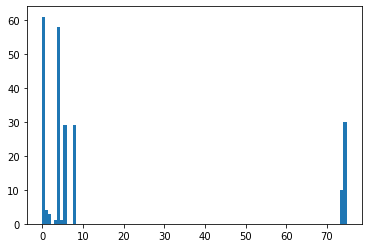

In [1903]:
# The histogram plot below shows that the columns in the dataset either have very high percentage(>70%) of missing values
# or a very low percentage(<10%) of missing values
plt.hist(df_attributes['Missing%'],bins=100)
plt.show()

In [1904]:
# Creating a list of columns which have a high percentage of missing values
high_missing_list=[]
for c in df.columns:
    if ((df[c].isnull().sum())/len(df))*100 >50:
        high_missing_list.append(c)

In [1905]:
high_missing_list

['date_of_last_rech_data_6',
 'date_of_last_rech_data_7',
 'date_of_last_rech_data_8',
 'date_of_last_rech_data_9',
 'total_rech_data_6',
 'total_rech_data_7',
 'total_rech_data_8',
 'total_rech_data_9',
 'max_rech_data_6',
 'max_rech_data_7',
 'max_rech_data_8',
 'max_rech_data_9',
 'count_rech_2g_6',
 'count_rech_2g_7',
 'count_rech_2g_8',
 'count_rech_2g_9',
 'count_rech_3g_6',
 'count_rech_3g_7',
 'count_rech_3g_8',
 'count_rech_3g_9',
 'av_rech_amt_data_6',
 'av_rech_amt_data_7',
 'av_rech_amt_data_8',
 'av_rech_amt_data_9',
 'arpu_3g_6',
 'arpu_3g_7',
 'arpu_3g_8',
 'arpu_3g_9',
 'arpu_2g_6',
 'arpu_2g_7',
 'arpu_2g_8',
 'arpu_2g_9',
 'night_pck_user_6',
 'night_pck_user_7',
 'night_pck_user_8',
 'night_pck_user_9',
 'fb_user_6',
 'fb_user_7',
 'fb_user_8',
 'fb_user_9']

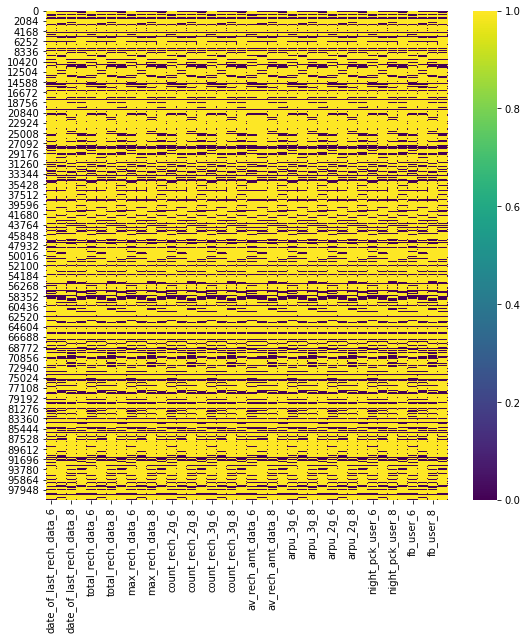

In [1906]:
# Visualizing the null values in the columns with a high percentage of missing values
plt.figure(figsize=(9,9))
sns.heatmap(df[high_missing_list].isnull(),cmap='viridis')
plt.show()

***Yellow regions in the above heatmap indicates missing values. There are some rows from which useful information can be extracted in order to filter out high value customers. Once the information has been extracted, some of these columns can be dropped.***

### Inspecting attributes corresponding to month 6(June) which have a high percentage of null values

In [1907]:
# Creating a list of columns(with high percentage of null values) pertaining to month 6(June)
month_6 = ['total_rech_data_6','max_rech_data_6','count_rech_2g_6','count_rech_3g_6','av_rech_amt_data_6','arpu_3g_6','arpu_2g_6',
           'night_pck_user_6','fb_user_6']

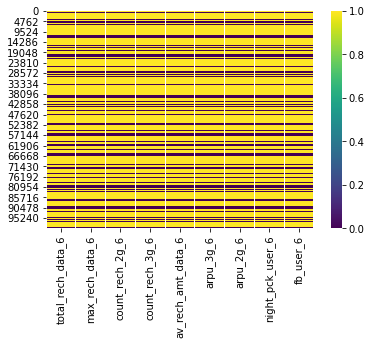

In [1908]:
sns.heatmap(df[month_6].isnull(),cmap='viridis')

In [1909]:
df['date_of_last_rech_data_6'][df['date_of_last_rech_data_6'].isnull()==True].isnull().sum()

74846

In [1910]:
# Printing the missing values in attributes for month 6(June) for which 'date_of_last_rech_data_6' is missing
df[month_6][df['date_of_last_rech_data_6'].isnull()==True].isnull().sum()

total_rech_data_6     74846
max_rech_data_6       74846
count_rech_2g_6       74846
count_rech_3g_6       74846
av_rech_amt_data_6    74846
arpu_3g_6             74846
arpu_2g_6             74846
night_pck_user_6      74846
fb_user_6             74846
dtype: int64

***As can be seen from the above visualization and the above data, all the rows which have 'date_of_last_rech_data_6' missing have missing values in all the other attributes. These customers did not recharge their phone in June. These missing values can be replaced with '0'.*** 

In [1911]:
# Replacing missing values in 'date_of_last_rech_data_6' with 'No_recharge_done'
df['date_of_last_rech_data_6']= df['date_of_last_rech_data_6'].fillna('No_Recharge_done')

In [1912]:
# Replacing the missing values in these columns with '0' as mentioned above
for k in month_6: 
    df[k]=df[k].fillna(0)

In [1913]:
# These columns now have no remaining missing values 
df[month_6].isnull().sum()

total_rech_data_6     0
max_rech_data_6       0
count_rech_2g_6       0
count_rech_3g_6       0
av_rech_amt_data_6    0
arpu_3g_6             0
arpu_2g_6             0
night_pck_user_6      0
fb_user_6             0
dtype: int64

### Inspecting attributes corresponding to month 7(July) which have a high percentage of null values and repeating the above procedure

In [1914]:
# Creating a list of columns(with high percentage of null values) pertaining to month 7(July)
month_7 = ['total_rech_data_7','max_rech_data_7','count_rech_2g_7','count_rech_3g_7','av_rech_amt_data_7','arpu_3g_7','arpu_2g_7',
           'night_pck_user_7','fb_user_7']

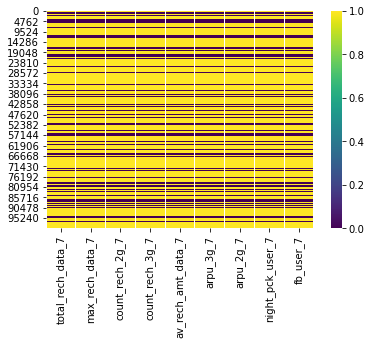

In [1915]:
sns.heatmap(df[month_7].isnull(),cmap='viridis')

In [1916]:
# Printing the number of missing values in the 'date_of_last_rech_data_7' column
df['date_of_last_rech_data_7'].isnull().sum()

74428

In [1917]:
# Printing the missing values in attributes for month 7(July) for which 'date_of_last_rech_data_7' is missing
df[month_7][df['date_of_last_rech_data_7'].isnull()==True].isnull().sum()

total_rech_data_7     74428
max_rech_data_7       74428
count_rech_2g_7       74428
count_rech_3g_7       74428
av_rech_amt_data_7    74428
arpu_3g_7             74428
arpu_2g_7             74428
night_pck_user_7      74428
fb_user_7             74428
dtype: int64

***Same as before, the above visualization and the above data shows that the rows which have 'date_of_last_rech_data_6' missing have missing values in all the other attributes. These customers did not recharge their phone in June. These missing values can be replaced with '0'.*** 

In [1918]:
# Replacing missing values in 'date_of_last_rech_data_7' with 'No_recharge_done'
df['date_of_last_rech_data_7']= df['date_of_last_rech_data_7'].fillna('No_Recharge_done')

In [1919]:
# Replacing the missing values in these columns with '0' as mentioned above
for k in month_7: 
    df[k]=df[k].fillna(0)

In [1920]:
# These columns now have no remaining missing values  
df[month_7][df['date_of_last_rech_data_7']=='No_Recharge_done'].isnull().sum()

total_rech_data_7     0
max_rech_data_7       0
count_rech_2g_7       0
count_rech_3g_7       0
av_rech_amt_data_7    0
arpu_3g_7             0
arpu_2g_7             0
night_pck_user_7      0
fb_user_7             0
dtype: int64

### Inspecting attributes corresponding to month 8(August) which have a high percentage of null values and repeating the above procedure

In [1921]:
# Creating a list of columns(with high percentage of null values) pertaining to month 8(August)
month_8 = ['total_rech_data_8','max_rech_data_8','count_rech_2g_8','count_rech_3g_8','av_rech_amt_data_8','arpu_3g_8','arpu_2g_8',
           'night_pck_user_8','fb_user_8']

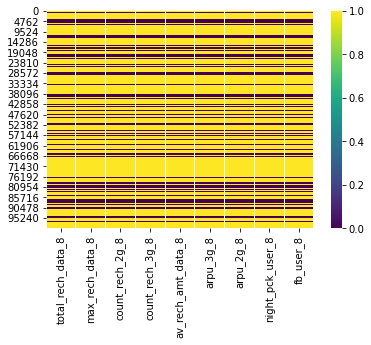

In [1922]:
sns.heatmap(df[month_8].isnull(),cmap='viridis')

In [1923]:
# Printing the number of missing values in the 'date_of_last_rech_data_8' column
df['date_of_last_rech_data_8'].isnull().sum()

73660

In [1924]:
# Printing the missing values in attributes for month 8(August) for which 'date_of_last_rech_data_8' is missing
df[month_8][df['date_of_last_rech_data_8'].isnull()==True].isnull().sum()

total_rech_data_8     73660
max_rech_data_8       73660
count_rech_2g_8       73660
count_rech_3g_8       73660
av_rech_amt_data_8    73660
arpu_3g_8             73660
arpu_2g_8             73660
night_pck_user_8      73660
fb_user_8             73660
dtype: int64

In [1925]:
# Replacing missing values in 'date_of_last_rech_data_8' with 'No_recharge_done'
df['date_of_last_rech_data_8']= df['date_of_last_rech_data_8'].fillna('No_Recharge_done')

In [1926]:
# Replacing the corresponding columns having missing values with '0'.
for k in month_8: 
    df[k]=df[k].fillna(0)

In [1927]:
# These columns now have no remaining missing values  
df[month_8][df['date_of_last_rech_data_8']=='No_Recharge_done'].isnull().sum()

total_rech_data_8     0
max_rech_data_8       0
count_rech_2g_8       0
count_rech_3g_8       0
av_rech_amt_data_8    0
arpu_3g_8             0
arpu_2g_8             0
night_pck_user_8      0
fb_user_8             0
dtype: int64

### Inspecting attributes corresponding to month 9(September) which have a high percentage of null values and repeating the above procedure

In [1928]:
# Creating a list of columns(with high percentage of null values) pertaining to month 9(September)
month_9 = ['total_rech_data_9','max_rech_data_9','count_rech_2g_9','count_rech_3g_9','av_rech_amt_data_9','arpu_3g_9','arpu_2g_9',
           'night_pck_user_9','fb_user_9']

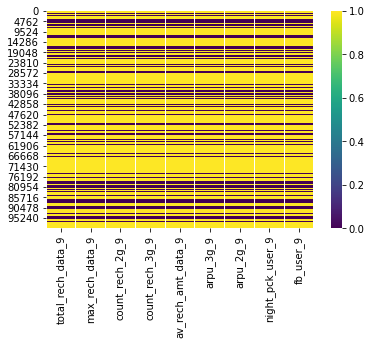

In [1929]:
sns.heatmap(df[month_9].isnull(),cmap='viridis')

In [1930]:
# Printing the number of missing values in the 'date_of_last_rech_data_9' column
df['date_of_last_rech_data_9'].isnull().sum()

74077

In [1931]:
# Printing the missing values in attributes for month 9(September) for which 'date_of_last_rech_data_9' is missing
df[month_9][df['date_of_last_rech_data_9'].isnull()==True].isnull().sum()

total_rech_data_9     74077
max_rech_data_9       74077
count_rech_2g_9       74077
count_rech_3g_9       74077
av_rech_amt_data_9    74077
arpu_3g_9             74077
arpu_2g_9             74077
night_pck_user_9      74077
fb_user_9             74077
dtype: int64

In [1932]:
# Replacing missing values in 'date_of_last_rech_data_9' with 'No_recharge_done'
df['date_of_last_rech_data_9']= df['date_of_last_rech_data_9'].fillna('No_Recharge_done')

In [1933]:
# Replacing the corresponding columns having missing values with '0'.
for k in month_9: 
    df[k]=df[k].fillna(0)

In [1934]:
# These columns now have no remaining missing values  
df[month_9][df['date_of_last_rech_data_9']=='No_Recharge_done'].isnull().sum()

total_rech_data_9     0
max_rech_data_9       0
count_rech_2g_9       0
count_rech_3g_9       0
av_rech_amt_data_9    0
arpu_3g_9             0
arpu_2g_9             0
night_pck_user_9      0
fb_user_9             0
dtype: int64

## Checking distribution of missing values in the dataset again

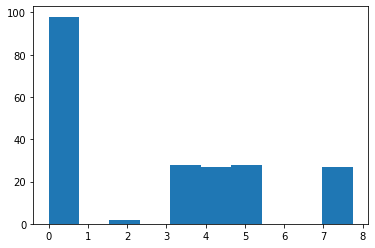

In [1935]:
remaining_missing_values=[]
for k in df.columns:
    remaining_missing_values.append(round((df[k].isnull().sum()/len(df))*100,2))
plt.hist(remaining_missing_values)
plt.show()

In [1936]:
pd.Series(remaining_missing_values).value_counts()

0.00    98
5.38    27
3.86    27
3.94    27
7.75    27
1.77     1
1.61     1
3.62     1
4.76     1
dtype: int64

***The remaining columns have low percentage(<8%) of missing values***

In [1937]:
missing_equal_to_5p38_percent = [k for k in df.columns if round((df[k].isnull().sum()/len(df))*100,2)==5.38 ]
for k in missing_equal_to_5p38_percent:
    print('{0} has 5.38% missing values and number of unique values in the column are {1}'.format(k,df[k].nunique()))

onnet_mou_8 has 5.38% missing values and number of unique values in the column are 24089
offnet_mou_8 has 5.38% missing values and number of unique values in the column are 30908
roam_ic_mou_8 has 5.38% missing values and number of unique values in the column are 5315
roam_og_mou_8 has 5.38% missing values and number of unique values in the column are 6504
loc_og_t2t_mou_8 has 5.38% missing values and number of unique values in the column are 13336
loc_og_t2m_mou_8 has 5.38% missing values and number of unique values in the column are 20544
loc_og_t2f_mou_8 has 5.38% missing values and number of unique values in the column are 3807
loc_og_t2c_mou_8 has 5.38% missing values and number of unique values in the column are 2516
loc_og_mou_8 has 5.38% missing values and number of unique values in the column are 25990
std_og_t2t_mou_8 has 5.38% missing values and number of unique values in the column are 18291
std_og_t2m_mou_8 has 5.38% missing values and number of unique values in the column

***None of the above columns having 5.38% missing values are categorical. The missing values in these columns will be imputed using the mean value***

In [1938]:
# Imputing the missing values using the mean value of the column
for k in missing_equal_to_5p38_percent:
    df[k]=df[k].fillna(df[k].mean())

In [1939]:
#Checking for the remaining missing values again
remaining_missing_values=[]
for k in df.columns:
    remaining_missing_values.append(round((df[k].isnull().sum()/len(df))*100,2))
pd.Series(remaining_missing_values).value_counts()

0.00    125
3.86     27
3.94     27
7.75     27
1.77      1
1.61      1
3.62      1
4.76      1
dtype: int64

In [1940]:
missing_equal_to_3p86_percent = [k for k in df.columns if round((df[k].isnull().sum()/len(df))*100,2)==3.86 ]
for k in missing_equal_to_3p86_percent:
    print('{0} has 3.86% missing values and number of unique values in the column are {1}'.format(k,df[k].nunique()))

onnet_mou_7 has 3.86% missing values and number of unique values in the column are 24336
offnet_mou_7 has 3.86% missing values and number of unique values in the column are 31023
roam_ic_mou_7 has 3.86% missing values and number of unique values in the column are 5230
roam_og_mou_7 has 3.86% missing values and number of unique values in the column are 6639
loc_og_t2t_mou_7 has 3.86% missing values and number of unique values in the column are 13411
loc_og_t2m_mou_7 has 3.86% missing values and number of unique values in the column are 20637
loc_og_t2f_mou_7 has 3.86% missing values and number of unique values in the column are 3863
loc_og_t2c_mou_7 has 3.86% missing values and number of unique values in the column are 2426
loc_og_mou_7 has 3.86% missing values and number of unique values in the column are 26091
std_og_t2t_mou_7 has 3.86% missing values and number of unique values in the column are 18567
std_og_t2m_mou_7 has 3.86% missing values and number of unique values in the column

***None of the above columns having 3.86% missing values are categorical. The missing values in these columns will be imputed using the mean value***

In [1941]:
# Imputing the missing values using the mean value of the column
for k in missing_equal_to_3p86_percent:
    df[k]=df[k].fillna(df[k].mean())

In [1942]:
#Checking for the remaining missing values again
remaining_missing_values=[]
for k in df.columns:
    remaining_missing_values.append(round((df[k].isnull().sum()/len(df))*100,2))
pd.Series(remaining_missing_values).value_counts()

0.00    152
3.94     27
7.75     27
1.77      1
1.61      1
3.62      1
4.76      1
dtype: int64

In [1943]:
missing_equal_to_3p94_percent = [k for k in df.columns if round((df[k].isnull().sum()/len(df))*100,2)==3.94 ]
for k in missing_equal_to_3p94_percent:
    print('{0} has 3.94% missing values and number of unique values in the column are {1}'.format(k,df[k].nunique()))

onnet_mou_6 has 3.94% missing values and number of unique values in the column are 24313
offnet_mou_6 has 3.94% missing values and number of unique values in the column are 31140
roam_ic_mou_6 has 3.94% missing values and number of unique values in the column are 6512
roam_og_mou_6 has 3.94% missing values and number of unique values in the column are 8038
loc_og_t2t_mou_6 has 3.94% missing values and number of unique values in the column are 13539
loc_og_t2m_mou_6 has 3.94% missing values and number of unique values in the column are 20905
loc_og_t2f_mou_6 has 3.94% missing values and number of unique values in the column are 3860
loc_og_t2c_mou_6 has 3.94% missing values and number of unique values in the column are 2235
loc_og_mou_6 has 3.94% missing values and number of unique values in the column are 26372
std_og_t2t_mou_6 has 3.94% missing values and number of unique values in the column are 18244
std_og_t2m_mou_6 has 3.94% missing values and number of unique values in the column

***None of the above columns having 3.94% missing values are categorical. The missing values in these columns will be imputed using the mean value***

In [1944]:
# Imputing the missing values using the mean value of the column
for k in missing_equal_to_3p94_percent:
    df[k]=df[k].fillna(df[k].mean())

In [1945]:
#Checking for the remaining missing values again
remaining_missing_values=[]
for k in df.columns:
    remaining_missing_values.append(round((df[k].isnull().sum()/len(df))*100,2))
pd.Series(remaining_missing_values).value_counts()

0.00    179
7.75     27
1.77      1
1.61      1
3.62      1
4.76      1
dtype: int64

In [1946]:
missing_equal_to_7p75_percent = [k for k in df.columns if round((df[k].isnull().sum()/len(df))*100,2)==7.75 ]
for k in missing_equal_to_7p75_percent:
    print('{0} has 7.75% missing values and number of unique values in the column are {1}'.format(k,df[k].nunique()))

onnet_mou_9 has 7.75% missing values and number of unique values in the column are 23565
offnet_mou_9 has 7.75% missing values and number of unique values in the column are 30077
roam_ic_mou_9 has 7.75% missing values and number of unique values in the column are 4827
roam_og_mou_9 has 7.75% missing values and number of unique values in the column are 5882
loc_og_t2t_mou_9 has 7.75% missing values and number of unique values in the column are 12949
loc_og_t2m_mou_9 has 7.75% missing values and number of unique values in the column are 20141
loc_og_t2f_mou_9 has 7.75% missing values and number of unique values in the column are 3758
loc_og_t2c_mou_9 has 7.75% missing values and number of unique values in the column are 2332
loc_og_mou_9 has 7.75% missing values and number of unique values in the column are 25376
std_og_t2t_mou_9 has 7.75% missing values and number of unique values in the column are 17934
std_og_t2m_mou_9 has 7.75% missing values and number of unique values in the column

***None of the above columns having 7.75% missing values are categorical. The missing values in these columns will be imputed using the mean value***

In [1947]:
# Imputing the missing values using the mean value of the column
for k in missing_equal_to_7p75_percent:
    df[k]=df[k].fillna(df[k].mean())

In [1948]:
#Checking for the remaining missing values again
remaining_missing_values=[]
for k in df.columns:
    remaining_missing_values.append(round((df[k].isnull().sum()/len(df))*100,2))
pd.Series(remaining_missing_values).value_counts()

0.00    206
1.77      1
1.61      1
3.62      1
4.76      1
dtype: int64

In [1949]:
missing_equal_to_1p77_percent = [k for k in df.columns if round((df[k].isnull().sum()/len(df))*100,2)==1.77 ]
for k in missing_equal_to_1p77_percent:
    print('{0} has 1.77% missing values and number of unique values in the column are {1}'.format(k,df[k].nunique()))

date_of_last_rech_7 has 1.77% missing values and number of unique values in the column are 31


In [1950]:
# Imputing the missing values in this column with 'No_Recharge_done'
df['date_of_last_rech_7']=df['date_of_last_rech_7'].fillna('No_Recharge_done')

In [1951]:
#Checking for the remaining missing values again
remaining_missing_values=[]
for k in df.columns:
    remaining_missing_values.append(round((df[k].isnull().sum()/len(df))*100,2))
pd.Series(remaining_missing_values).value_counts()

0.00    207
1.61      1
3.62      1
4.76      1
dtype: int64

In [1952]:
missing_equal_to_1p61_percent = [k for k in df.columns if round((df[k].isnull().sum()/len(df))*100,2)==1.61 ]
for k in missing_equal_to_1p61_percent:
    print('{0} has 1.61% missing values and number of unique values in the column are {1}'.format(k,df[k].nunique()))

date_of_last_rech_6 has 1.61% missing values and number of unique values in the column are 30


In [1953]:
# Imputing the missing values in this column with 'No_Recharge_done'
df['date_of_last_rech_6']=df['date_of_last_rech_6'].fillna('No_Recharge_done')

In [1954]:
missing_equal_to_3p62_percent = [k for k in df.columns if round((df[k].isnull().sum()/len(df))*100,2)==3.62 ]
for k in missing_equal_to_3p62_percent:
    print('{0} has 3.62% missing values and number of unique values in the column are {1}'.format(k,df[k].nunique()))

date_of_last_rech_8 has 3.62% missing values and number of unique values in the column are 31


In [1955]:
# Imputing the missing values in this column with 'No_Recharge_done'
df['date_of_last_rech_8']=df['date_of_last_rech_8'].fillna('No_Recharge_done')

In [1956]:
missing_equal_to_4p76_percent = [k for k in df.columns if round((df[k].isnull().sum()/len(df))*100,2)==4.76 ]
for k in missing_equal_to_4p76_percent:
    print('{0} has 4.76% missing values and number of unique values in the column are {1}'.format(k,df[k].nunique()))

date_of_last_rech_9 has 4.76% missing values and number of unique values in the column are 30


In [1957]:
# Imputing the missing values in this column with 'No_Recharge_done'
df['date_of_last_rech_9']=df['date_of_last_rech_9'].fillna('No_Recharge_done')

## Final Check of the dataset for missing values

In [1958]:
remaining_missing_values=[]
for k in df.columns:
    remaining_missing_values.append(round((df[k].isnull().sum()/len(df))*100,2))
pd.Series(remaining_missing_values).value_counts()

0.0    210
dtype: int64

***The dataset has no remaining missing values***

# Filtering High Value Customers

In [1959]:
# 'total_rech_data_6' column contains the count of the number of times data recharge was done
# 'av_rech_amt_data_6' column contains the monthly average data recharge amount for each user
# The same is true for 'total_rech_data_7' and 'av_rech_amt_data_7'
# Creating columns corresponding to total data recharge amount as follows

df['total_rech_data_6_amt']=df['total_rech_data_6']*df['av_rech_amt_data_6']
df['total_rech_data_7_amt']=df['total_rech_data_7']*df['av_rech_amt_data_7']

In [1960]:
# Calculating the total recharge(in amount) done for each month
df['total_recharge_6']=df['total_rech_amt_6']+df['total_rech_data_6_amt']
df['total_recharge_7']=df['total_rech_amt_7']+df['total_rech_data_7_amt']

In [1961]:
# Creating a column 'av_recharge_6_7' containing the average of total recharge amount for month 6 and 7
df['av_recharge_6_7'] = (df['total_recharge_6']+df['total_recharge_7'])/2

In [1962]:
# Filtering the high value customer based on te 70th percentile of column 'av_recharge_6_7'
# Storing the data pertaining to high value customers in the dataframe called 'df_hvc'

df_hvc = df[ df['av_recharge_6_7']>= np.percentile(df['av_recharge_6_7'],70) ] 

In [1963]:
# The new dataframe has about 30001 rows and 215 columns
df_hvc.shape

(30001, 215)

In [1964]:
# Dropping the redundant columns using which the column 'av_recharge_6_7' was created
df_hvc.drop(['total_rech_data_6_amt','total_rech_data_6','av_rech_amt_data_6',
            'total_rech_data_7_amt','total_rech_data_7','av_rech_amt_data_7',
            'total_recharge_6','total_rech_amt_6','total_recharge_7','total_rech_amt_7'],axis=1,inplace=True)

## Creating the Churn(target) Column

In [1965]:
# Creating the churn column based on usage of services in the month of September.
#If net usage in terms of voice calls(mou) and mobile internet usage(vol) is zero then the Churn=1, else Churn=0 

df_hvc['Churn'] = [1 if x == 0 else 0 for x in df_hvc[['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']].sum(axis=1)]


In [1966]:
# There are about 8% of likely Churners in the dataset of high value customers
df_hvc['Churn'].value_counts(normalize=True)*100

0    91.863605
1     8.136395
Name: Churn, dtype: float64

***The target column is highly skewed.***

In [1967]:
df_hvc.shape

(30001, 206)

In [1968]:
# Dropping all other attributes pertaining to month 9(September) as our analysis will be based on the previous 3 months
df_hvc = df_hvc.drop([c for c in df_hvc.columns if '_9' in c],axis=1)

In [1969]:
# 155 columns remain after dropping the aforementioned columns
df_hvc.shape

(30001, 155)

In [1970]:
# Dropping 'mobile_number' from the dataset
df_hvc = df_hvc.drop('mobile_number',axis=1)

### Creating new categorical columns from the date columns

In [1971]:
# Information regarding the number of times recharge was done and the total, average amount of recharge done etc. is already
# contained in other columns. Therefore, we will convert columns containing information corresponding to last date of 
# recharge into categorical columns and rename the column as 'recharge_done_6/7/8'
# For example, if there was no recharge done in month 6, then recharge_done_6 = 0 , else recharge_done_6 = 1

date_columns = [x for x in df_hvc.columns if 'date' in x]

for d in date_columns:
    df_hvc[d] = [0 if i == 'No_Recharge_done' else 1 for i in df_hvc[d]]

In [1972]:
# Renaming the date columns

df_hvc.rename(columns={'date_of_last_rech_6':'recharge_done_6', 'date_of_last_rech_7':'recharge_done_7',
                      'date_of_last_rech_8':'recharge_done_8','date_of_last_rech_data_6':'data_recharge_done_6',
                      'date_of_last_rech_data_7':'data_recharge_done_7', 'date_of_last_rech_data_8':'data_recharge_done_8'},
             inplace=True)

In [1973]:
# Since our churn model is usage based and not revenue based, we will drop some of the columns that are directly revenue based
df_hvc = df_hvc.drop([x for x in df_hvc.columns if 'amt' in x], axis=1)
df_hvc = df_hvc.drop([x for x in df_hvc.columns if 'arpu' in x], axis=1)
df_hvc = df_hvc.drop([x for x in df_hvc.columns if 'rech_' in x], axis=1)



In [1974]:
df_hvc = df_hvc.drop('av_recharge_6_7',axis=1)

In [1975]:
# Defining a function that will be used to evaluate classification models 

def evaluate_model(classifier,train,test):
    train_pred = classifier.predict(train)
    test_pred = classifier.predict(test)
    confusion_train = confusion_matrix(y_train, train_pred)
    confusion_test = confusion_matrix(y_test, test_pred)
    
    TP1 = confusion_train[1,1] # true positive 
    TN1 = confusion_train[0,0] # true negatives
    FP1 = confusion_train[0,1] # false positives
    FN1 = confusion_train[1,0] # false negatives    
    
    TP2 = confusion_test[1,1] # true positive 
    TN2 = confusion_test[0,0] # true negatives
    FP2 = confusion_test[0,1] # false positives
    FN2 = confusion_test[1,0] # false negatives    
    
    sensitivity_train = TP1 / float(TP1+FN1)
    specificity_train = TN1 / float(TN1+FP1)

    sensitivity_test = TP2 / float(TP2+FN2)
    specificity_test = TN2 / float(TN2+FP2)

  
    print('The accuracy of the model on the train set is:{}'.format(accuracy_score(y_train, train_pred)))
    print('The accuracy of the model on the test set is:{}'.format(accuracy_score(y_test, test_pred)))
    print('The sensitivity of the model on the train set is:{}'.format(sensitivity_train))
    print('The specificity of the model on the train set is:{}'.format(specificity_train))
    print('The sensitivity of the model on the test set is:{}'.format(sensitivity_test))
    print('The specificity of the model on the test set is:{}'.format(specificity_test))
    
    

# Handling Data Imbalance

In [1976]:
df_hvc['Churn'].value_counts(normalize=True)*100

0    91.863605
1     8.136395
Name: Churn, dtype: float64

***The target variable is highly skewed. 91% are non-churners and 8% are churners. The machine learning models will give more weightage to the non-churners rather than the churners. We want the models to give equal weightage to both classes. We will therefore up-sample the non-churning class.***

In [1977]:
# Splitting the data into train and test
df_train, df_test = train_test_split(df_hvc, train_size=0.7, test_size=0.3, random_state=100, stratify=df_hvc['Churn'])

***The train-test split is being done before balancing the data so that the test set does not have duplicates of the churning customers. Else, our model will overfit.***

In [1978]:
df_train['Churn'].value_counts(normalize=True)

0    0.918619
1    0.081381
Name: Churn, dtype: float64

In [1979]:
df_test['Churn'].value_counts(normalize=True)

0    0.918676
1    0.081324
Name: Churn, dtype: float64

***The target variable in both train and test sets have the same distribution of Churners and non-Churners***

Class 0: 19291
Class 1: 1709
Proportion: 11.29 : 1


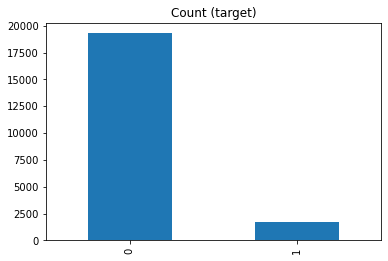

In [1980]:
# Checking the proportion of non-churners:churners
target_count = df_train.Churn.value_counts()
print('Class 0:', target_count[0])
print('Class 1:', target_count[1])
print('Proportion:', round(target_count[0] / target_count[1], 2), ': 1')

target_count.plot(kind='bar', title='Count (target)');

***The ratio of non-churners:churners is about 11:1***

In [1981]:
# Storing the count of 0's and 1's in count_0, count_1 respectively
count_0, count_1 = df_train.Churn.value_counts()

# Dividing the train data into 2 sets
df_0 = df_train[df_train['Churn'] == 0]
df_1 = df_train[df_train['Churn'] == 1]

Count after balancing
Class 0: 9645
Class 1: 9645
Proportion: 1.0 : 1


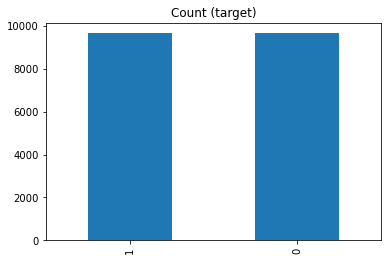

In [1982]:
# Up-sampling minority class
df_class_1_over = df_1.sample(count_0//2, random_state=100,replace=True)

# Down-sampling majority class
df_class_0_under = df_0.sample(count_0//2, random_state=100)

# Concatenating the two dataframes to create a balanced dataset
df_balanced = pd.concat([df_class_0_under, df_class_1_over], axis=0)

print('Count after balancing')

target_count = df_balanced.Churn.value_counts()
print('Class 0:', target_count[0])
print('Class 1:', target_count[1])
print('Proportion:', round(target_count[0] / target_count[1], 2), ': 1')


df_balanced.Churn.value_counts().plot(kind='bar', title='Count (target)');

In [1983]:
# The training data is now balanced. 
# Storing the balanced training set in dataframe called 'df_trainb'
df_trainb = df_balanced
#This will be the data used to train the machine learning models 

# Building Preliminary Tree Models

***Building preliminary models to gauge performance of models on the raw dataset. This will also give some understanding of feature importances which we can use to perform EDA to gain some customer insights.***

## Building Decision Tree Classifiers

In [1984]:
# Creating a train dataframe 'X_train' with the predictor features
X_train = df_trainb.drop(['Churn'], axis=1)

In [1985]:
# Creating the train dataframe 'y_train' with the target/dependent variables
y_train = df_trainb['Churn']

In [1986]:
# Building a simple decision tree classifier with max_depth = 3
dt1 = DecisionTreeClassifier(max_depth=3)
dt1.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3)

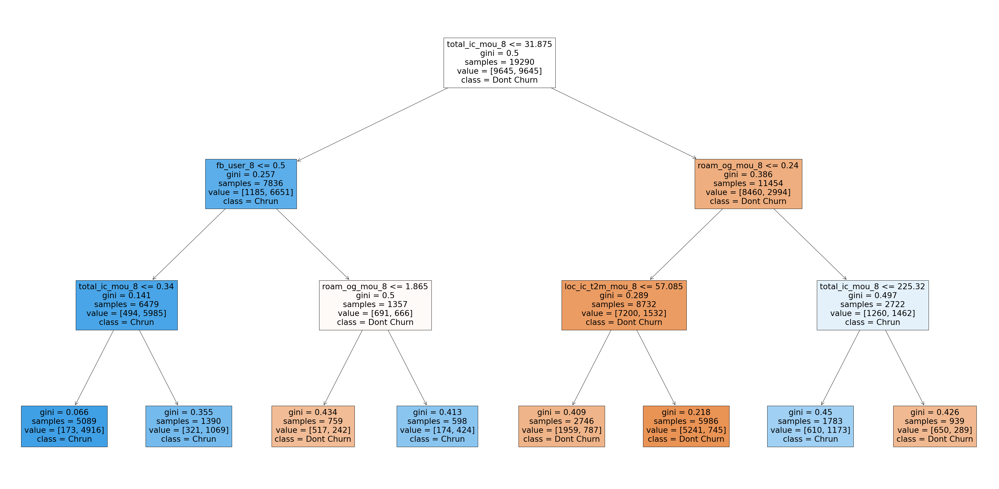

In [1987]:
# Visualizing the decision tree
plt.figure(figsize=(60,30))
plot_tree(dt1 , feature_names = X_train.columns, class_names=['Dont Churn','Chrun'],filled=True)
plt.show()

***The above tree model has used predictors from month 8(Action Phase) in order to distinguish between churners and non-churners.***

In [1988]:
# Creating a test dataframe 'X_test' with the predictor features
X_test = df_test.drop(['Churn'], axis=1)

In [1989]:
# Evaluating the model on train and test set
y_train = df_trainb['Churn']
y_test = df_test['Churn']
evaluate_model(dt1,X_train,X_test)

The accuracy of the model on the train set is:0.8268014515292897
The accuracy of the model on the test set is:0.8583490723252972
The sensitivity of the model on the train set is:0.7861067910834629
The specificity of the model on the train set is:0.8674961119751167
The sensitivity of the model on the test set is:0.7841530054644809
The specificity of the model on the test set is:0.8649171604788971


***The simple decision tree model has a sensitivity of 78% on the test set and a specificity of about 87% on the test set.***

## EDA based on understanding of feature importances from above tree model

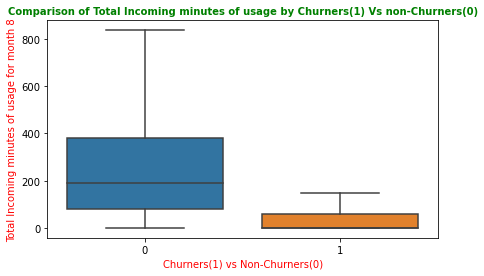

In [1990]:
# Box-plots corresponding to the total incoming usage of Churners(1) vs non-Churners(0)
plt.figure(figsize=[7,4])
sns.boxplot(df_hvc['Churn'], df_hvc['total_ic_mou_8'],showfliers=False)
plt.title('Comparison of Total Incoming minutes of usage by Churners(1) Vs non-Churners(0)', color = 'Green', fontweight='bold', fontsize=10)
plt.ylabel('Total Incoming minutes of usage for month 8', color = 'Red', fontsize=10)
plt.xlabel('Churners(1) vs Non-Churners(0)', color = 'Red', fontsize=10)
plt.show()

In [1991]:
df_hvc.groupby('Churn')['total_ic_mou_8'].mean()

Churn
0    299.096525
1     63.444342
Name: total_ic_mou_8, dtype: float64

***As we can see, there is a significant difference in the average incoming minutes of usage in month 8 between the churners and non-churners.***

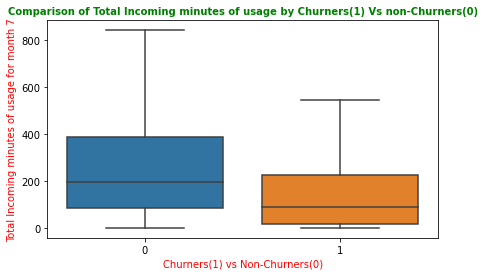

In [1992]:
# Box-plots corresponding to the total incoming usage of Churners(1) vs non-Churners(0)
plt.figure(figsize=[7,4])
sns.boxplot(df_hvc['Churn'], df_hvc['total_ic_mou_7'],showfliers=False)
plt.title('Comparison of Total Incoming minutes of usage by Churners(1) Vs non-Churners(0)', color = 'Green', fontweight='bold', fontsize=10)
plt.ylabel('Total Incoming minutes of usage for month 7', color = 'Red', fontsize=10)
plt.xlabel('Churners(1) vs Non-Churners(0)', color = 'Red', fontsize=10)
plt.show()

In [1993]:
df_hvc.groupby('Churn')['total_ic_mou_7'].mean()

Churn
0    306.840677
1    182.907534
Name: total_ic_mou_7, dtype: float64

***By comparing the incoming minutes of usage between the good phase and the action phase, we can observe that the average minutes of usage has stayed roughly the same for the non-churners whereas average the minutes of usage has significantly decreased for the churners.***

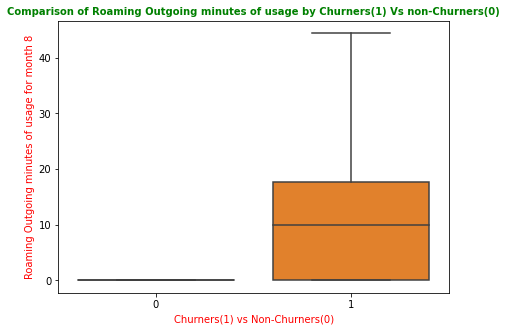

In [1994]:
# Box-plots corresponding to the roaming outgoing usage of Churners(1) vs non-Churners(0)
plt.figure(figsize=[7,5])
sns.boxplot(df_hvc['Churn'], df_hvc['roam_og_mou_8'],showfliers=False)
plt.title('Comparison of Roaming Outgoing minutes of usage by Churners(1) Vs non-Churners(0)', color = 'Green', fontweight='bold', fontsize=10)
plt.ylabel('Roaming Outgoing minutes of usage for month 8', color = 'Red', fontsize=10)
plt.xlabel('Churners(1) vs Non-Churners(0)', color = 'Red', fontsize=10)
plt.show()

In [1995]:
df_hvc.groupby('Churn')['roam_og_mou_8'].mean()

Churn
0    17.897868
1    46.878361
Name: roam_og_mou_8, dtype: float64

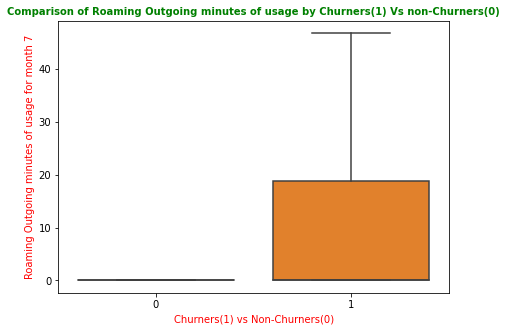

In [1996]:
# Box-plots corresponding to the roaming outgoing usage of Churners(1) vs non-Churners(0)
plt.figure(figsize=[7,5])
sns.boxplot(df_hvc['Churn'], df_hvc['roam_og_mou_7'],showfliers=False)
plt.title('Comparison of Roaming Outgoing minutes of usage by Churners(1) Vs non-Churners(0)', color = 'Green', fontweight='bold', fontsize=10)
plt.ylabel('Roaming Outgoing minutes of usage for month 7', color = 'Red', fontsize=10)
plt.xlabel('Churners(1) vs Non-Churners(0)', color = 'Red', fontsize=10)
plt.show()

In [1997]:
df_hvc.groupby('Churn')['roam_og_mou_7'].mean()

Churn
0    17.611607
1    50.995280
Name: roam_og_mou_7, dtype: float64

In [1998]:
df_hvc.groupby('Churn')['roam_og_mou_6'].mean()

Churn
0    24.535486
1    52.665569
Name: roam_og_mou_6, dtype: float64

***By looking at the average roaming outgoing minutes of usage of customers, we can observe that the churners tend to have a significantly higher usage consistently throughout the 3 months before the churn phase.***  

## Tuning the hyperparameters of the Decision Tree

In [1999]:
# Creating a parameter grid
params = { 'max_depth':[3,5,10,12,14,16,18,20,25] , 'min_samples_leaf':[100,200,300,500,750,1000]}

In [2000]:
# Using GridSearchCV to find the optimal set of parameters
grid_search = GridSearchCV(estimator = dt1, param_grid=params, cv=4, verbose=1, n_jobs=-1, scoring='accuracy')
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 54 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed:  3.0min finished


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(max_depth=3), n_jobs=-1,
             param_grid={'max_depth': [3, 5, 10, 12, 14, 16, 18, 20, 25],
                         'min_samples_leaf': [100, 200, 300, 500, 750, 1000]},
             scoring='accuracy', verbose=1)

In [2001]:
# Creating a dataframe having the results of the grid search
grid_search_results=pd.DataFrame(grid_search.cv_results_)
grid_search_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,1.840762,0.057425,0.016991,0.001413,3,100,"{'max_depth': 3, 'min_samples_leaf': 100}",0.822932,0.825005,0.827665,0.812526,0.822032,0.005739,33
1,1.848757,0.057029,0.013992,0.001869,3,200,"{'max_depth': 3, 'min_samples_leaf': 200}",0.822932,0.825005,0.827665,0.812526,0.822032,0.005739,33
2,0.548909,0.043538,0.026235,0.003560,3,300,"{'max_depth': 3, 'min_samples_leaf': 300}",0.822932,0.825005,0.827665,0.812526,0.822032,0.005739,33
3,0.522922,0.012608,0.030481,0.006978,3,500,"{'max_depth': 3, 'min_samples_leaf': 500}",0.818578,0.822932,0.822895,0.809830,0.818559,0.005341,36
4,0.521175,0.033058,0.023735,0.012941,3,750,"{'max_depth': 3, 'min_samples_leaf': 750}",0.802198,0.811113,0.815222,0.810659,0.809798,0.004734,37


In [2002]:
# Checking the hyperparameters of the best estimator
grid_search.best_estimator_

DecisionTreeClassifier(max_depth=10, min_samples_leaf=100)

In [2003]:
# Building a hyperparameter tuned decision tree classifier
dt2 = DecisionTreeClassifier(max_depth=10,min_samples_leaf=100)
dt2.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=10, min_samples_leaf=100)

In [2004]:
# Evaluating the model on train and test set
y_train_pred = dt2.predict(X_train)
y_test_pred = dt2.predict(X_test)
evaluate_model(dt2,X_train,X_test)

The accuracy of the model on the train set is:0.8652669777086573
The accuracy of the model on the test set is:0.8394622819686701
The sensitivity of the model on the train set is:0.8793157076205288
The specificity of the model on the train set is:0.8512182477967859
The sensitivity of the model on the test set is:0.8128415300546448
The specificity of the model on the test set is:0.8418188414560406


***After Hyperparameter Tuning, the sensitivity on the test set has improved from 78% to 81%. This is good since we are concerned about improving the sensitivity of the model. The specificity of the model has decreased from 87% to 84%. Thus, the hypertuned model is able to predict churners better than the previous model. However, the sensitivity of the model on the test set is significantly lower thant the sensitivity on the train set indicating the model is overfitting.***

## Building Random Forest Classifiers

In [2005]:
from sklearn.ensemble import RandomForestClassifier

In [2006]:
# Building a Random Forest Classifier 
rf = RandomForestClassifier(random_state=100, max_depth=10, n_estimators=50, oob_score=True)
rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=10, n_estimators=50, oob_score=True,
                       random_state=100)

In [2007]:
# Checking the out of bag score of the model 
rf.oob_score_

0.93950233281493

In [2008]:
# Evaluating the model on train and test set
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)
evaluate_model(rf,X_train,X_test)

The accuracy of the model on the train set is:0.9587350959046138
The accuracy of the model on the test set is:0.9177869125652706
The sensitivity of the model on the train set is:0.9632970451010886
The specificity of the model on the train set is:0.9541731467081389
The sensitivity of the model on the test set is:0.7308743169398907
The specificity of the model on the test set is:0.9343330511549159


***The basic random forest model as defined above seems to be heavily overfitting based on the sensitivity on the train set(96%) and the test set(73%).***

## Tuning the hyperparameters of the Random Forest Classifier

In [2009]:
# Creating a parameter grid
params = { 'max_depth':[3,5,10,12,14] , 'min_samples_leaf':[200,300,500], 
          'n_estimators':[100,150,200,300]}

In [2010]:
# Running a grid search to find the optimal set of parameters
grid_search = GridSearchCV(estimator = rf, param_grid=params, cv=4, verbose=1, n_jobs=-1, scoring='roc_auc')
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 60 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   41.4s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:  5.8min finished


GridSearchCV(cv=4,
             estimator=RandomForestClassifier(max_depth=10, n_estimators=50,
                                              oob_score=True,
                                              random_state=100),
             n_jobs=-1,
             param_grid={'max_depth': [3, 5, 10, 12, 14],
                         'min_samples_leaf': [200, 300, 500],
                         'n_estimators': [100, 150, 200, 300]},
             scoring='roc_auc', verbose=1)

In [2011]:
# Creating a dataframe having the results of the grid search
grid_search_results=pd.DataFrame(grid_search.cv_results_)
grid_search_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,4.231881,0.370882,0.127171,0.031779,3,200,100,"{'max_depth': 3, 'min_samples_leaf': 200, 'n_e...",0.904130,0.908131,0.908907,0.897035,0.904551,0.004702,55
1,6.409037,0.283081,0.127919,0.007170,3,200,150,"{'max_depth': 3, 'min_samples_leaf': 200, 'n_e...",0.905133,0.908082,0.909526,0.897133,0.904968,0.004793,53
2,8.752335,0.183219,0.186883,0.030552,3,200,200,"{'max_depth': 3, 'min_samples_leaf': 200, 'n_e...",0.905889,0.908481,0.910267,0.897774,0.905603,0.004781,50
3,14.298656,0.077180,0.245847,0.008799,3,200,300,"{'max_depth': 3, 'min_samples_leaf': 200, 'n_e...",0.906384,0.908480,0.910134,0.897838,0.905709,0.004735,49
4,5.256001,0.064950,0.147158,0.012668,3,300,100,"{'max_depth': 3, 'min_samples_leaf': 300, 'n_e...",0.903447,0.907855,0.908624,0.896356,0.904070,0.004872,56


In [2012]:
# Checking the hyperparameters of the best estimator
grid_search.best_estimator_

RandomForestClassifier(max_depth=12, min_samples_leaf=200, n_estimators=200,
                       oob_score=True, random_state=100)

In [2013]:
# Building the tuned Random Forest Model 
rf2 = RandomForestClassifier(random_state=100, max_depth=12, min_samples_leaf=200, n_estimators=200, oob_score=True)
rf2.fit(X_train, y_train)

RandomForestClassifier(max_depth=12, min_samples_leaf=200, n_estimators=200,
                       oob_score=True, random_state=100)

In [2014]:
# Checking the out of bag score of the random forest model 
rf2.oob_score_

0.8455676516329704

In [2015]:
# Evaluating the model on train and test set
y_train_pred = rf2.predict(X_train)
y_test_pred = rf2.predict(X_test)
evaluate_model(rf2,X_train,X_test)

The accuracy of the model on the train set is:0.8486262312078797
The accuracy of the model on the test set is:0.8895678257971337
The sensitivity of the model on the train set is:0.7930533955417315
The specificity of the model on the train set is:0.904199066874028
The sensitivity of the model on the test set is:0.7622950819672131
The specificity of the model on the test set is:0.9008344418914016


***The sensitivity of the Random Forest model after hyperparamter tuning has improved from 73% to 76% on the test set. The amount of overfitting has decreased from the previous model though there is still some amount of overfitting in terms of the sensitivity of the model. The overall accuracy of the model on the test set is about 89%.***

# Deriving New Variables

In [2016]:
# Making a copy of the original train dataset
df_train2 = df_trainb.copy(deep=True)
df_test2 = df_test.copy(deep=True)

In [2017]:
# Deriving the following new variables for both the train and test set:
# 'usage_diff_mou' : This variable is the difference between the total minutes of usage during the action phase(month 8) and the
#                    average total minutes of usage during the good phase(month 6 and 7)
# 'usage_diff_mou' : This variable is the difference between the total mobile internet usage during the action phase(month 8) and the
#                    average total mobile internet usage during the good phase(month 6 and 7)

df_train2['usage_diff_mou']= (df_train2['total_ic_mou_8']+df_train2['total_og_mou_8']) -( df_train2['total_ic_mou_6']+df_train2['total_og_mou_6'] + df_train2['total_ic_mou_7']+df_train2['total_og_mou_7'] )/2  

df_train2['usage_diff_vol']= (df_train2['vol_2g_mb_8']+df_train2['vol_3g_mb_8']) - ( df_train2['vol_2g_mb_6']+df_train2['vol_3g_mb_6']  +  df_train2['vol_2g_mb_7']+df_train2['vol_3g_mb_7'] )/2  

df_test2['usage_diff_mou']= (df_test2['total_ic_mou_8']+df_test2['total_og_mou_8']) - ( df_test2['total_ic_mou_6']+df_test2['total_og_mou_6']  +  df_test2['total_ic_mou_7']+df_test2['total_og_mou_7'] )/2  

df_test2['usage_diff_vol']= (df_test2['vol_2g_mb_8']+df_test2['vol_3g_mb_8']) -( df_test2['vol_2g_mb_6']+df_test2['vol_3g_mb_6']  +  df_test2['vol_2g_mb_7']+df_test2['vol_3g_mb_7'] )/2  




In [2018]:
# Dropping the original variables which were used to derive the new variables
drop_vars = ['total_ic_mou_8','total_og_mou_8','total_ic_mou_6','total_og_mou_6','total_ic_mou_7','total_og_mou_7',
            'vol_2g_mb_8','vol_3g_mb_8','vol_2g_mb_6','vol_3g_mb_6','vol_2g_mb_7','vol_3g_mb_7']
df_train2 = df_train2.drop(drop_vars,axis=1)
df_test2 = df_test2.drop(drop_vars,axis=1)


In [2019]:
# Making a copy of the original dataframe
df2 = df_hvc.copy(deep=True)

In [2020]:
# Creating the derived columns in the duplicated dataframe
df2['usage_diff_mou']= (df2['total_ic_mou_8']+df2['total_og_mou_8']) -( df2['total_ic_mou_6']+df2['total_og_mou_6'] + df2['total_ic_mou_7']+df2['total_og_mou_7'] )/2  

df2['usage_diff_vol']= (df2['vol_2g_mb_8']+df2['vol_3g_mb_8']) - ( df2['vol_2g_mb_6']+df2['vol_3g_mb_6']  +  df2['vol_2g_mb_7']+df2['vol_3g_mb_7'] )/2  


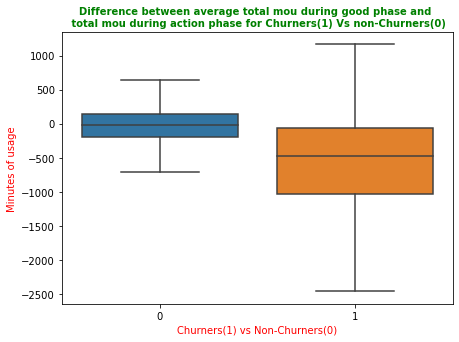

In [2021]:
# Box-plots corresponding to the 'usage_diff_mou' column for Churners(1) vs non-Churners(0)

plt.figure(figsize=[7,5])
sns.boxplot(df2['Churn'], df2['usage_diff_mou'],showfliers=False)
plt.title('Difference between average total mou during good phase and \n total mou during action phase for Churners(1) Vs non-Churners(0)', color = 'Green', fontweight='bold', fontsize=10)
plt.ylabel('Minutes of usage', color = 'Red', fontsize=10)
plt.xlabel('Churners(1) vs Non-Churners(0)', color = 'Red', fontsize=10)
plt.show()

In [2022]:
df2.groupby(by='Churn')['usage_diff_mou'].mean()

Churn
0    -30.994256
1   -643.967054
Name: usage_diff_mou, dtype: float64

***As seen above, there is a significant difference in the distribution of 'usage_diff_mou' between churners and non-churners. In particular, the churners, on average, had a significantly lower mou during the action phase. This can be a significant indicator of churn/non-churn.*** 

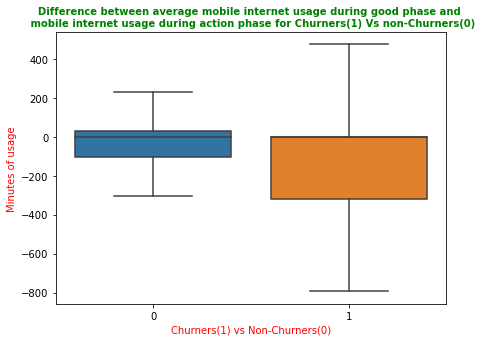

In [2023]:
# Box-plots corresponding to the 'usage_diff_vol' column for Churners(1) vs non-Churners(0)
plt.figure(figsize=[7,5])
sns.boxplot(df2['Churn'], df2['usage_diff_vol'],showfliers=False)
plt.title('Difference between average mobile internet usage during good phase and \n mobile internet usage during action phase for Churners(1) Vs non-Churners(0)', color = 'Green', fontweight='bold', fontsize=10)
plt.ylabel('Minutes of usage', color = 'Red', fontsize=10)
plt.xlabel('Churners(1) vs Non-Churners(0)', color = 'Red', fontsize=10)
plt.show()

In [2024]:
df2.groupby(by='Churn')['usage_diff_vol'].mean()

Churn
0     -6.588661
1   -240.619306
Name: usage_diff_vol, dtype: float64

***Similar to the previous derived variable, there is also a difference(between good phase and action phase) in the average mobile internet usage of churners and non-churners. However, the difference here is less significant than that of minutes of og/ic usage.***

### Building  Logistic Regression Models

In [2025]:
# Creating a dataframe 'X_train' with the new set of predictor features
X_train = df_train2.drop(['Churn'], axis=1)

In [2026]:
# Creating the dataframe 'y_train' with the target/dependent variables
y_train = df_train2['Churn']

In [2027]:
logreg = LogisticRegression()

In [2028]:
# Using Recursive Feature elimination to select the initial set of features
rfe = RFE(logreg, 20)             # running RFE for selecting 20 features
rfe = rfe.fit(X_train, y_train)

In [2029]:
# Ranking the variables in order of preference
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('onnet_mou_6', False, 2),
 ('onnet_mou_7', False, 16),
 ('onnet_mou_8', False, 32),
 ('offnet_mou_6', False, 77),
 ('offnet_mou_7', True, 1),
 ('offnet_mou_8', False, 85),
 ('roam_ic_mou_6', False, 66),
 ('roam_ic_mou_7', False, 45),
 ('roam_ic_mou_8', False, 35),
 ('roam_og_mou_6', False, 20),
 ('roam_og_mou_7', True, 1),
 ('roam_og_mou_8', False, 34),
 ('loc_og_t2t_mou_6', False, 7),
 ('loc_og_t2t_mou_7', False, 67),
 ('loc_og_t2t_mou_8', False, 24),
 ('loc_og_t2m_mou_6', False, 44),
 ('loc_og_t2m_mou_7', True, 1),
 ('loc_og_t2m_mou_8', False, 36),
 ('loc_og_t2f_mou_6', True, 1),
 ('loc_og_t2f_mou_7', False, 42),
 ('loc_og_t2f_mou_8', True, 1),
 ('loc_og_t2c_mou_6', True, 1),
 ('loc_og_t2c_mou_7', False, 53),
 ('loc_og_t2c_mou_8', False, 23),
 ('loc_og_mou_6', False, 8),
 ('loc_og_mou_7', False, 62),
 ('loc_og_mou_8', False, 11),
 ('std_og_t2t_mou_6', False, 65),
 ('std_og_t2t_mou_7', False, 43),
 ('std_og_t2t_mou_8', False, 82),
 ('std_og_t2m_mou_6', False, 9),
 ('std_og_t2m_mou_7

In [2030]:
# Storing the selected variables in a list named 'col'
col = X_train.columns[rfe.support_]
col

Index(['offnet_mou_7', 'roam_og_mou_7', 'loc_og_t2m_mou_7', 'loc_og_t2f_mou_6',
       'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'std_og_t2m_mou_7',
       'isd_og_mou_7', 'loc_ic_mou_6', 'std_ic_t2m_mou_7', 'std_ic_t2m_mou_8',
       'ic_others_7', 'ic_others_8', 'data_recharge_done_8', 'sachet_2g_7',
       'sachet_2g_8', 'sachet_3g_8', 'fb_user_8', 'sep_vbc_3g',
       'usage_diff_mou'],
      dtype='object')

In [2031]:
# The insignificant variables after performing RFE are
X_train.columns[~rfe.support_]

Index(['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6',
       'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8',
       'roam_og_mou_6', 'roam_og_mou_8', 'loc_og_t2t_mou_6',
       'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6',
       'loc_og_t2m_mou_8', 'loc_og_t2f_mou_7', 'loc_og_t2c_mou_7',
       'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8',
       'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8',
       'std_og_t2m_mou_6', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6',
       'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7',
       'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_8', 'spl_og_mou_6',
       'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7',
       'og_others_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7',
       'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7',
       'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7',
       'loc_ic_t2f_mou_8', 'loc_ic_mou_

In [2032]:
# Building a logistic regression model and getting the summary of the model
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                19290
Model:                            GLM   Df Residuals:                    19269
Model Family:                Binomial   Df Model:                           20
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -9206.7
Date:                Sat, 27 Feb 2021   Deviance:                       18413.
Time:                        14:55:35   Pearson chi2:                 7.90e+04
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.5807      0.033     17.747      0.000       0.517       0.645
offnet_mou_7            -0.0024      0.000     -5.212      0.000      -0.003      -0.002
roam_og_mou_7            0.0037      0.000     10.136      0.000       0.003       0.004
loc_og_t2m_mou_7         0.0004      0.000      0.786      0.432      -0.001       0.001
loc_og_t2f_mou_6        -0.0058      0.002     -3.230      0.001      -0.009      -0.002
loc_og_t2f_mou_8        -0.0033      0.002     -1.449      0.147      -0.008       0.001
loc_og_t2c_mou_6        -0.0081      0.004     -2.104      0.035      -0.016      -0.001
std_og_t2m_mou_7         0.0018      0.000      3.823      0.000       0.001       0.003
isd_og_mou_7             0.0060      0.001      6.060      0.000       0.004       0.008
loc_ic_mou_6            -0.0014   7.88e-05    -17.229      0.000      -0.002      -0.001
std_ic_t2m_mou_7        -0.0023      0.000     -8.231      0.000      -0.003      -0.002
std_ic_t2m_mou_8         0.0018      0.000      5.019      0.000       0.001       0.002
ic_others_7             -0.0062      0.002     -2.899      0.004      -0.010      -0.002
ic_others_8              0.0027      0.002      1.083      0.279      -0.002       0.008
data_recharge_done_8    -0.6133      0.091     -6.745      0.000      -0.791      -0.435
sachet_2g_7              0.1202      0.010     11.689      0.000       0.100       0.140
sachet_2g_8             -0.2137      0.016    -13.006      0.000      -0.246      -0.181
sachet_3g_8              0.0281      0.024      1.186      0.236      -0.018       0.075
fb_user_8               -0.7072      0.093     -7.632      0.000      -0.889      -0.526
sep_vbc_3g              -0.0243      0.003     -8.382      0.000      -0.030      -0.019
usage_diff_mou          -0.0019   4.34e-05    -44.779      0.000      -0.002      -0.002
========================================================================================
"""

In [2033]:
# Creating a dataframe with the VIFs of selected features
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
# Printing the VIFs of selected features
vif

,Features,VIF
0,offnet_mou_7,137.44
6,std_og_t2m_mou_7,91.65
2,loc_og_t2m_mou_7,22.79
13,data_recharge_done_8,8.86
17,fb_user_8,8.27
1,roam_og_mou_7,3.44
3,loc_og_t2f_mou_6,2.25
4,loc_og_t2f_mou_8,2.24
15,sachet_2g_8,2.23
9,std_ic_t2m_mou_7,2.11


***There are a number of columns with high p-values and high VIFs.***

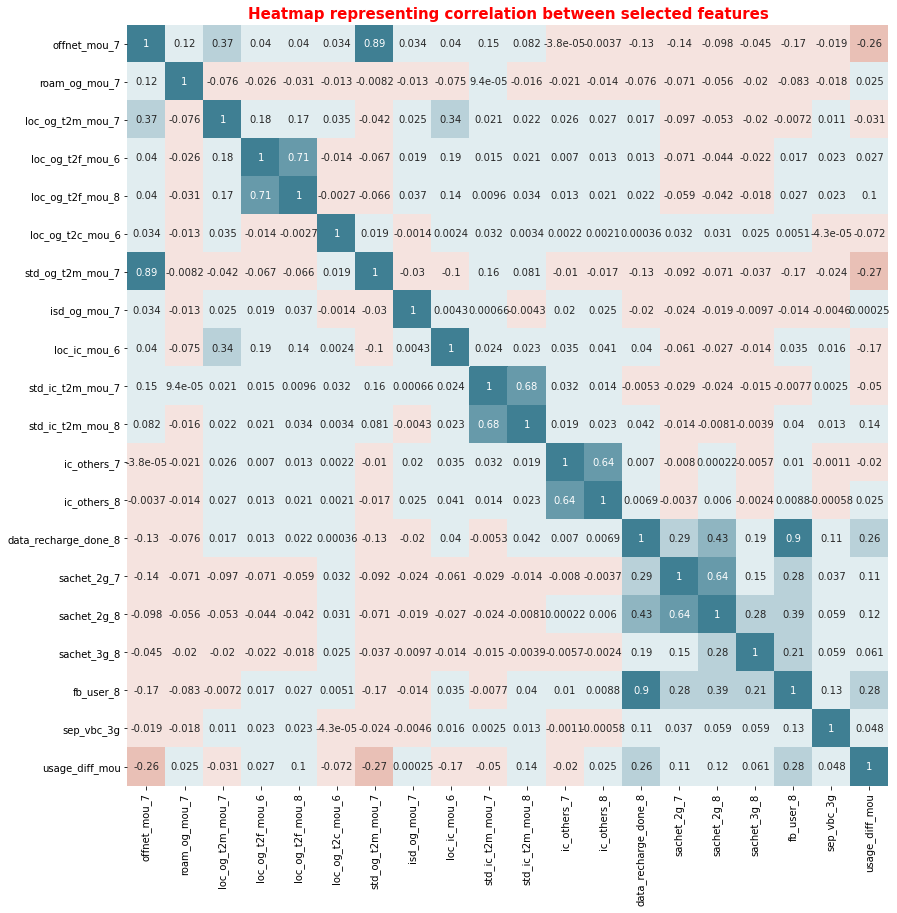

In [2034]:
# Plotting the Heatmap of the above computed correlation matrix
plt.figure(figsize=[14,14])
sns.heatmap(X_train[col].corr(),vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=10),
    square=True,annot=True,cbar=False)
plt.title('Heatmap representing correlation between selected features', color = 'Red', fontweight='bold', fontsize=15)
plt.show()

### Dropping variables based on high p-values

In [2035]:
# Dropping the 'loc_og_t2m_mou_7' column
col = [x for x in col if x!='loc_og_t2m_mou_7']

In [2036]:
# Checking the model summary again after 1 column with high p-value has been removed
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                19290
Model:                            GLM   Df Residuals:                    19270
Model Family:                Binomial   Df Model:                           19
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -9207.0
Date:                Sat, 27 Feb 2021   Deviance:                       18414.
Time:                        14:55:44   Pearson chi2:                 8.01e+04
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.5821      0.033     17.815      0.000       0.518       0.646
offnet_mou_7            -0.0021      0.000    -19.335      0.000      -0.002      -0.002
roam_og_mou_7            0.0034      0.000     19.293      0.000       0.003       0.004
loc_og_t2f_mou_6        -0.0059      0.002     -3.315      0.001      -0.009      -0.002
loc_og_t2f_mou_8        -0.0036      0.002     -1.567      0.117      -0.008       0.001
loc_og_t2c_mou_6        -0.0082      0.004     -2.128      0.033      -0.016      -0.001
std_og_t2m_mou_7         0.0014      0.000     12.404      0.000       0.001       0.002
isd_og_mou_7             0.0057      0.001      6.268      0.000       0.004       0.007
loc_ic_mou_6            -0.0014   7.84e-05    -17.240      0.000      -0.002      -0.001
std_ic_t2m_mou_7        -0.0023      0.000     -8.241      0.000      -0.003      -0.002
std_ic_t2m_mou_8         0.0018      0.000      5.011      0.000       0.001       0.002
ic_others_7             -0.0062      0.002     -2.895      0.004      -0.010      -0.002
ic_others_8              0.0027      0.002      1.076      0.282      -0.002       0.008
data_recharge_done_8    -0.6116      0.091     -6.727      0.000      -0.790      -0.433
sachet_2g_7              0.1200      0.010     11.676      0.000       0.100       0.140
sachet_2g_8             -0.2136      0.016    -13.008      0.000      -0.246      -0.181
sachet_3g_8              0.0279      0.024      1.179      0.239      -0.019       0.074
fb_user_8               -0.7096      0.093     -7.661      0.000      -0.891      -0.528
sep_vbc_3g              -0.0243      0.003     -8.376      0.000      -0.030      -0.019
usage_diff_mou          -0.0019   4.34e-05    -44.777      0.000      -0.002      -0.002
========================================================================================
"""

In [2037]:
# Dropping the 'ic_others_8' column
col = [x for x in col if x!='ic_others_8']

In [2038]:
# Checking the model summary again after 1 column with high p-value has been removed
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                19290
Model:                            GLM   Df Residuals:                    19271
Model Family:                Binomial   Df Model:                           18
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -9207.6
Date:                Sat, 27 Feb 2021   Deviance:                       18415.
Time:                        14:55:46   Pearson chi2:                 8.07e+04
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.5830      0.033     17.844      0.000       0.519       0.647
offnet_mou_7            -0.0021      0.000    -19.327      0.000      -0.002      -0.002
roam_og_mou_7            0.0034      0.000     19.288      0.000       0.003       0.004
loc_og_t2f_mou_6        -0.0059      0.002     -3.321      0.001      -0.009      -0.002
loc_og_t2f_mou_8        -0.0035      0.002     -1.544      0.123      -0.008       0.001
loc_og_t2c_mou_6        -0.0082      0.004     -2.128      0.033      -0.016      -0.001
std_og_t2m_mou_7         0.0014      0.000     12.397      0.000       0.001       0.002
isd_og_mou_7             0.0057      0.001      6.246      0.000       0.004       0.008
loc_ic_mou_6            -0.0013   7.83e-05    -17.216      0.000      -0.002      -0.001
std_ic_t2m_mou_7        -0.0023      0.000     -8.259      0.000      -0.003      -0.002
std_ic_t2m_mou_8         0.0018      0.000      5.033      0.000       0.001       0.002
ic_others_7             -0.0050      0.002     -2.634      0.008      -0.009      -0.001
data_recharge_done_8    -0.6115      0.091     -6.727      0.000      -0.790      -0.433
sachet_2g_7              0.1200      0.010     11.673      0.000       0.100       0.140
sachet_2g_8             -0.2136      0.016    -13.005      0.000      -0.246      -0.181
sachet_3g_8              0.0280      0.024      1.182      0.237      -0.018       0.074
fb_user_8               -0.7102      0.093     -7.668      0.000      -0.892      -0.529
sep_vbc_3g              -0.0243      0.003     -8.377      0.000      -0.030      -0.019
usage_diff_mou          -0.0019   4.33e-05    -44.794      0.000      -0.002      -0.002
========================================================================================
"""

In [2039]:
# Dropping the 'sachet_3g_8' column
col = [x for x in col if x!='sachet_3g_8']

In [2040]:
# Checking the model summary again after 1 column with high p-value has been removed
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                19290
Model:                            GLM   Df Residuals:                    19272
Model Family:                Binomial   Df Model:                           17
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -9208.3
Date:                Sat, 27 Feb 2021   Deviance:                       18417.
Time:                        14:55:46   Pearson chi2:                 8.02e+04
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.5836      0.033     17.865      0.000       0.520       0.648
offnet_mou_7            -0.0021      0.000    -19.335      0.000      -0.002      -0.002
roam_og_mou_7            0.0034      0.000     19.299      0.000       0.003       0.004
loc_og_t2f_mou_6        -0.0059      0.002     -3.330      0.001      -0.009      -0.002
loc_og_t2f_mou_8        -0.0035      0.002     -1.554      0.120      -0.008       0.001
loc_og_t2c_mou_6        -0.0082      0.004     -2.120      0.034      -0.016      -0.001
std_og_t2m_mou_7         0.0014      0.000     12.403      0.000       0.001       0.002
isd_og_mou_7             0.0057      0.001      6.246      0.000       0.004       0.008
loc_ic_mou_6            -0.0013   7.83e-05    -17.221      0.000      -0.002      -0.001
std_ic_t2m_mou_7        -0.0023      0.000     -8.262      0.000      -0.003      -0.002
std_ic_t2m_mou_8         0.0018      0.000      5.029      0.000       0.001       0.002
ic_others_7             -0.0050      0.002     -2.637      0.008      -0.009      -0.001
data_recharge_done_8    -0.6136      0.091     -6.751      0.000      -0.792      -0.435
sachet_2g_7              0.1197      0.010     11.641      0.000       0.100       0.140
sachet_2g_8             -0.2115      0.016    -12.923      0.000      -0.244      -0.179
fb_user_8               -0.7007      0.092     -7.598      0.000      -0.882      -0.520
sep_vbc_3g              -0.0243      0.003     -8.358      0.000      -0.030      -0.019
usage_diff_mou          -0.0019   4.33e-05    -44.796      0.000      -0.002      -0.002
========================================================================================
"""

In [2041]:
# Dropping the 'loc_og_t2f_mou_8' column
col = [x for x in col if x!='loc_og_t2f_mou_8']

In [2042]:
# Checking the model summary again after 1 column with high p-value has been removed
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                19290
Model:                            GLM   Df Residuals:                    19273
Model Family:                Binomial   Df Model:                           16
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -9209.5
Date:                Sat, 27 Feb 2021   Deviance:                       18419.
Time:                        14:55:47   Pearson chi2:                 8.24e+04
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.5776      0.032     17.809      0.000       0.514       0.641
offnet_mou_7            -0.0021      0.000    -19.757      0.000      -0.002      -0.002
roam_og_mou_7            0.0034      0.000     19.478      0.000       0.003       0.004
loc_og_t2f_mou_6        -0.0075      0.001     -5.037      0.000      -0.010      -0.005
loc_og_t2c_mou_6        -0.0083      0.004     -2.146      0.032      -0.016      -0.001
std_og_t2m_mou_7         0.0015      0.000     12.709      0.000       0.001       0.002
isd_og_mou_7             0.0057      0.001      6.177      0.000       0.004       0.007
loc_ic_mou_6            -0.0014   7.83e-05    -17.268      0.000      -0.002      -0.001
std_ic_t2m_mou_7        -0.0023      0.000     -8.298      0.000      -0.003      -0.002
std_ic_t2m_mou_8         0.0018      0.000      5.041      0.000       0.001       0.002
ic_others_7             -0.0050      0.002     -2.653      0.008      -0.009      -0.001
data_recharge_done_8    -0.6131      0.091     -6.742      0.000      -0.791      -0.435
sachet_2g_7              0.1199      0.010     11.658      0.000       0.100       0.140
sachet_2g_8             -0.2111      0.016    -12.901      0.000      -0.243      -0.179
fb_user_8               -0.7002      0.092     -7.588      0.000      -0.881      -0.519
sep_vbc_3g              -0.0243      0.003     -8.370      0.000      -0.030      -0.019
usage_diff_mou          -0.0020   4.27e-05    -45.783      0.000      -0.002      -0.002
========================================================================================
"""

***None of the remaining predictors have p-values higher that 5%***

### Dropping variables based on high VIFs

In [2043]:
# Creating a dataframe with the VIFs of selected features
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
# Printing the VIFs of selected features
vif

,Features,VIF
0,offnet_mou_7,8.99
10,data_recharge_done_8,8.85
13,fb_user_8,8.20
4,std_og_t2m_mou_7,7.54
12,sachet_2g_8,2.13
7,std_ic_t2m_mou_7,2.11
8,std_ic_t2m_mou_8,2.08
11,sachet_2g_7,1.95
6,loc_ic_mou_6,1.69
15,usage_diff_mou,1.46


In [2044]:
# Dropping the 'data_recharge_done_8' column
col = [x for x in col if x!='data_recharge_done_8']

In [2045]:
# Creating a dataframe with the VIFs of selected features
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
# Printing the VIFs of selected features
vif

,Features,VIF
0,offnet_mou_7,8.90
4,std_og_t2m_mou_7,7.53
7,std_ic_t2m_mou_7,2.11
8,std_ic_t2m_mou_8,2.08
11,sachet_2g_8,2.06
10,sachet_2g_7,1.95
6,loc_ic_mou_6,1.68
12,fb_user_8,1.59
14,usage_diff_mou,1.46
1,roam_og_mou_7,1.18


In [2046]:
# Dropping the 'offnet_mou_7' column
col = [x for x in col if x!='offnet_mou_7']

In [2047]:
# Creating a dataframe with the VIFs of selected features
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
# Printing the VIFs of selected features
vif

,Features,VIF
6,std_ic_t2m_mou_7,2.11
7,std_ic_t2m_mou_8,2.08
10,sachet_2g_8,2.06
9,sachet_2g_7,1.95
11,fb_user_8,1.57
5,loc_ic_mou_6,1.45
13,usage_diff_mou,1.45
3,std_og_t2m_mou_7,1.27
1,loc_og_t2f_mou_6,1.12
2,loc_og_t2c_mou_6,1.07


***None of the remaining predictors have VIFs higher than 5***

### Building the final logistic regression model

In [2048]:
# Using a min-max scaler to transform 'X_train'
scaler = MinMaxScaler()
X_train[col] = scaler.fit_transform(X_train[col])
X_test = df_test2.drop(['Churn'], axis=1)
X_test[col] = scaler.transform(X_test[col])
X_test_sm = sm.add_constant(X_test[col])

In [2049]:
# Building the logistic regression model with the final set of selected features
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                19290
Model:                            GLM   Df Residuals:                    19275
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -9451.4
Date:                Sat, 27 Feb 2021   Deviance:                       18903.
Time:                        14:55:51   Pearson chi2:                 6.49e+04
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const               11.4103      0.241     47.350      0.000      10.938      11.883
roam_og_mou_7        6.2927      0.484     13.004      0.000       5.344       7.241
loc_og_t2f_mou_6    -7.8573      0.896     -8.769      0.000      -9.613      -6.101
loc_og_t2c_mou_6    -1.6730      0.548     -3.055      0.002      -2.746      -0.600
std_og_t2m_mou_7    -5.3328      0.400    -13.347      0.000      -6.116      -4.550
isd_og_mou_7         5.9016      1.521      3.879      0.000       2.920       8.883
loc_ic_mou_6       -13.2441      0.566    -23.400      0.000     -14.353     -12.135
std_ic_t2m_mou_7    -7.1472      0.857     -8.343      0.000      -8.826      -5.468
std_ic_t2m_mou_8     4.7788      1.065      4.487      0.000       2.691       6.866
ic_others_7         -3.6245      1.217     -2.979      0.003      -6.009      -1.240
sachet_2g_7          4.1515      0.312     13.324      0.000       3.541       4.762
sachet_2g_8        -11.0264      0.728    -15.151      0.000     -12.453      -9.600
fb_user_8           -1.2016      0.044    -27.577      0.000      -1.287      -1.116
sep_vbc_3g         -47.3225      5.682     -8.329      0.000     -58.459     -36.186
usage_diff_mou     -20.3729      0.448    -45.472      0.000     -21.251     -19.495
====================================================================================
"""

***The final model has 14 predictors of which the derived variable 'usage_diff_mou' is a significant predictor.***

## Evaluating the logistic regression model on the train set

In [2050]:
# Getting the predicted values on the train set
y_train_predicted = res.predict(X_train_sm)

# Converting the predicted values into a series
y_train_predicted = y_train_predicted.values.reshape(-1)

predictions = pd.DataFrame({'Actual':y_train.values, 'Churn_Probability':y_train_predicted})


# Storing the predicted values as 'Churn_Prob'
predictions['Churn_Probability'] = y_train_predicted


# Creating columns with predictions for different probability cutoffs 
cut_off_probs = [float(x)/10 for x in range(10)]
for p in cut_off_probs:
    predictions[p]= predictions['Churn_Probability'].map(lambda x: 1 if x > p else 0)


In [2051]:
# Displaying the predictions at different cut-off probabilities
predictions.head()

,Actual,Churn_Probability,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.739779,1,1,1,1,1,1,1,1,0,0
1,0,0.009325,1,0,0,0,0,0,0,0,0,0
2,0,0.374589,1,1,1,1,0,0,0,0,0,0
3,0,0.270226,1,1,1,0,0,0,0,0,0,0
4,0,0.616560,1,1,1,1,1,1,1,0,0,0


In [2052]:
# Calculating the accuracy, sensitivity and specificity for various probability cutoffs.
evaluation = pd.DataFrame( columns = ['Cut_off_probs','Accuracy','Sensitivity','Specificity'])

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

cut_off_probs = [float(x)/10 for x in range(10)]
for p in cut_off_probs:
    cm1 = metrics.confusion_matrix(predictions['Actual'], predictions[p] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    evaluation.loc[p] =[ p ,accuracy,sensi,speci]


In [2053]:
# Evaluating the model performance at various cut-off probabilities
evaluation

,Cut_off_probs,Accuracy,Sensitivity,Specificity
0.0,0.0,0.500000,1.000000,0.000000
0.1,0.1,0.582893,0.979160,0.186625
0.2,0.2,0.665734,0.961431,0.370036
0.3,0.3,0.731623,0.900674,0.562571
0.4,0.4,0.767030,0.855677,0.678383
0.5,0.5,0.785277,0.797926,0.772628
0.6,0.6,0.782374,0.697045,0.867703
0.7,0.7,0.726594,0.530223,0.922965
0.8,0.8,0.674702,0.392017,0.957387
0.9,0.9,0.583048,0.183515,0.982582


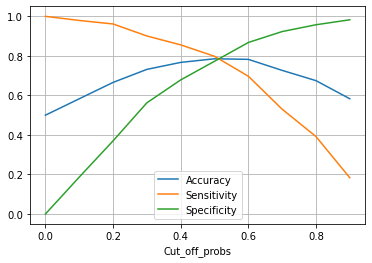

In [2054]:
# Plotting the accuracy, sensitivity and specificity for various cut off probabilities.
evaluation.plot.line(x='Cut_off_probs', y=['Accuracy','Sensitivity','Specificity'],grid=True)
plt.show()

***From the above plot we can infer that a cut-off probability of about 0.5 is the optimal choice.***

In [2055]:
# Using the above mentioned cutoff to make predictions on the training set 
predictions['final_churn_predictions'] = predictions['Churn_Probability'].map( lambda x: 1 if x > 0.5 else 0)

In [2056]:
#Checking the overall accuracy on the train set 
metrics.accuracy_score(predictions['Actual'], predictions['final_churn_predictions'])

0.785277345775013

In [2057]:
#Creating the Confusion Matrix for the predictions on the train set
confusion2 = metrics.confusion_matrix(predictions['Actual'], predictions['final_churn_predictions'] )

TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives


In [2058]:
# Checking the sensitivity of our logistic regression model on the train set
print('Sensitivity of the logistic regression model on the train set is:',TP / float(TP+FN))

Sensitivity of the logistic regression model on the train set is: 0.7979263867288751


In [2059]:
# Checking the specificity of our logistic regression model on the train set
print('Specificity of the logistic regression model on the train set is:',TN / float(TN+FP))

Specificity of the logistic regression model on the train set is: 0.7726283048211509


## Evaluating the logistic regression model on the test set

In [2060]:
y_test = df_test2['Churn']

# Getting the predicted values on the test set
y_test_predicted_prob = res.predict(X_test_sm)

# Converting the predicted probability values into a series
y_test_predicted_prob = y_test_predicted_prob.values.reshape(-1)


test_predictions = pd.DataFrame({'Actual':y_test.values, 'Churn_Probability':pd.Series(y_test_predicted_prob)})


# Storing the predicted values as 'Churn_Prob'
test_predictions['Churn_Probability'] = pd.Series(y_test_predicted_prob)

# Creating columns with predictions for different probability cutoffs 
test_predictions['Predicted_Churn']= test_predictions['Churn_Probability'].map(lambda x: 1 if x > 0.5 else 0)


In [2061]:
test_predictions.head()

,Actual,Churn_Probability,Predicted_Churn
0,0,0.042582,0
1,0,0.293363,0
2,0,0.273700,0
3,0,0.571560,1
4,0,0.144611,0


In [2062]:
#Checking the overall accuracy on the test set 
metrics.accuracy_score(test_predictions['Actual'], test_predictions['Predicted_Churn'])

0.7670258860126653

In [2063]:
#Creating the Confusion Matrix for the predictions on the test set
confusion2 = metrics.confusion_matrix(test_predictions['Actual'], test_predictions['Predicted_Churn'] )

TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives


In [2064]:
# Checking the sensitivity of our logistic regression model on the test set
print('Sensitivity of the logistic regression model on the train set is:',TP / float(TP+FN))

Sensitivity of the logistic regression model on the train set is: 0.7745901639344263


In [2065]:
# Checking the specificity of our logistic regression model on the test set
print('Specificity of the logistic regression model on the train set is:',TN / float(TN+FP))

Specificity of the logistic regression model on the train set is: 0.7663562704075463


In [2066]:
# Defining a function to plot the ROC curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic curve')
    plt.legend(loc="lower right")
    plt.show()

    return None

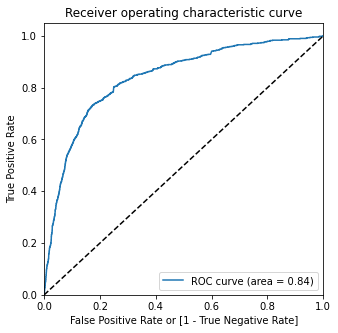

In [2067]:
# Plotting the ROC curve on the test set
fpr, tpr, thresholds = metrics.roc_curve( test_predictions['Actual'], test_predictions['Churn_Probability'], drop_intermediate = False )
draw_roc(test_predictions['Actual'], test_predictions['Churn_Probability'])

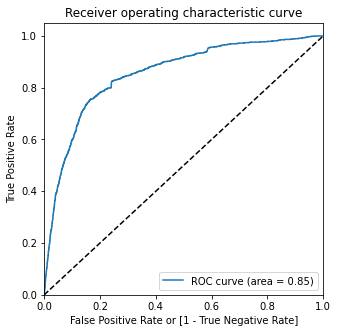

In [2068]:
# Plotting the ROC curve on the train set
fpr, tpr, thresholds = metrics.roc_curve( predictions['Actual'], predictions['Churn_Probability'], drop_intermediate = False )
draw_roc(predictions['Actual'], predictions['Churn_Probability'])

***The model has very similar roc curves and the roc-auc score for both the train and test sets are around 85%.***

# Performing PCA

In [2069]:
# Creating train and test dataframes with the predictor features
X_train = df_trainb.drop(['Churn'], axis=1)
X_test = df_test.drop(['Churn'],axis=1)
# Creating the dataframe 'y' with the target/dependent variables
y_train = df_trainb['Churn']
y_test = df_test['Churn']


In [2070]:
# Scaling the variables
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [2071]:
# Performing PCA on the train set
from sklearn.decomposition import PCA
pca = PCA(random_state=100)
pca.fit(X_train)

PCA(random_state=100)

In [2072]:
# Displaying components after performing PCA
pca.components_

array([[-2.17229176e-02, -1.62047738e-02, -9.32856105e-03, ...,
         1.66915750e-02,  1.03923159e-02,  2.05284773e-03],
       [ 1.21338269e-02,  1.68406055e-02,  1.45909711e-02, ...,
         1.48461696e-03, -8.55930889e-03,  2.00985243e-03],
       [ 5.10382448e-03,  3.88467783e-03,  5.25469943e-03, ...,
        -2.10068988e-03,  6.71809436e-03,  1.76425714e-03],
       ...,
       [ 6.64028870e-06, -9.95115298e-06, -6.33827365e-06, ...,
         4.16421040e-08, -1.14933107e-07,  2.32589121e-07],
       [-1.23605746e-06, -7.88034439e-07,  4.28918378e-06, ...,
        -2.08293262e-08,  6.42349412e-08,  2.44003789e-08],
       [-1.45187449e-07, -9.25759190e-08, -1.54489310e-07, ...,
         1.41298866e-07, -8.29332241e-08, -1.77994730e-07]])

In [2073]:
# Checking the explained variance ratio
pca.explained_variance_ratio_

array([5.40037994e-01, 1.30560273e-01, 9.07792901e-02, 3.34060713e-02,
       2.79646804e-02, 2.36354235e-02, 1.77883765e-02, 1.16478848e-02,
       1.01474693e-02, 9.13075844e-03, 8.27449111e-03, 7.67675598e-03,
       7.44945172e-03, 6.32434837e-03, 6.00056188e-03, 5.64315367e-03,
       4.23364247e-03, 3.59355686e-03, 3.56568892e-03, 3.44728608e-03,
       2.91977470e-03, 2.77914315e-03, 2.58026356e-03, 2.48252852e-03,
       2.38642856e-03, 2.22090885e-03, 2.11772495e-03, 1.95422398e-03,
       1.83858016e-03, 1.61942888e-03, 1.37655713e-03, 1.23092564e-03,
       1.13928854e-03, 1.11937587e-03, 1.07114587e-03, 1.03099464e-03,
       1.01274351e-03, 9.94930298e-04, 9.18949042e-04, 8.70708491e-04,
       8.53216216e-04, 8.26823782e-04, 7.94726903e-04, 7.63536405e-04,
       7.42054878e-04, 6.59073093e-04, 5.60830388e-04, 5.12904229e-04,
       4.98392193e-04, 4.85584281e-04, 4.30987094e-04, 4.28133592e-04,
       4.13404725e-04, 4.06279510e-04, 4.01528642e-04, 3.83520662e-04,
      

<BarContainer object of 122 artists>

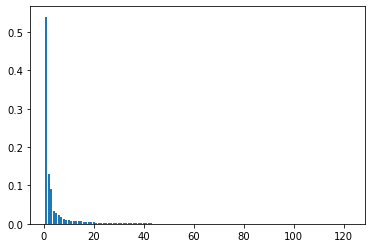

In [2074]:
# Plotting the explained variance ratio
plt.bar(range(1,len(pca.explained_variance_ratio_)+1),pca.explained_variance_ratio_)

<BarContainer object of 122 artists>

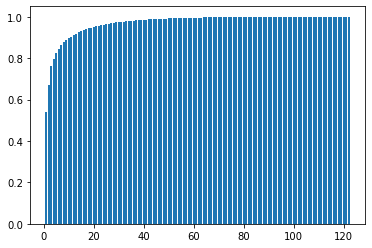

In [2075]:
# Plotting the cumulative explained variance ratio
var_cumu = np.cumsum(pca.explained_variance_ratio_)
plt.bar(range(1,len(var_cumu)+1),var_cumu)

In [2076]:
var_cumu

array([0.54003799, 0.67059827, 0.76137756, 0.79478363, 0.82274831,
       0.84638373, 0.86417211, 0.87581999, 0.88596746, 0.89509822,
       0.90337271, 0.91104947, 0.91849892, 0.92482327, 0.93082383,
       0.93646698, 0.94070063, 0.94429418, 0.94785987, 0.95130716,
       0.95422693, 0.95700608, 0.95958634, 0.96206887, 0.9644553 ,
       0.96667621, 0.96879393, 0.97074815, 0.97258673, 0.97420616,
       0.97558272, 0.97681365, 0.97795293, 0.97907231, 0.98014346,
       0.98117445, 0.98218719, 0.98318212, 0.98410107, 0.98497178,
       0.985825  , 0.98665182, 0.98744655, 0.98821009, 0.98895214,
       0.98961121, 0.99017204, 0.99068495, 0.99118334, 0.99166892,
       0.99209991, 0.99252805, 0.99294145, 0.99334773, 0.99374926,
       0.99413278, 0.99450267, 0.99482092, 0.9951327 , 0.9954153 ,
       0.9956846 , 0.99592736, 0.99615707, 0.99637175, 0.99658441,
       0.99678377, 0.99698254, 0.99716586, 0.99733899, 0.99750983,
       0.99767112, 0.99780709, 0.99794212, 0.99807011, 0.99819

***The explained variance ratio with 60 components is about 99.5%.***

In [2077]:
# Performing PCA with 60 components
pca60 = PCA(n_components=60, random_state=100)
X_train_pca60 = pca60.fit_transform(X_train)

In [2078]:
# Storing the train components in a dataframe 'df_pca60'
df_pca60_train = pd.DataFrame(X_train_pca60, columns=['PC{0}'.format(i) for i in range(60)])

In [2079]:
# Transforming the test dataset using pca60
X_test_pca60 = pca60.transform(X_test)

# Storing the test components in a dataframe 'df_pca60'
df_pca60_test = pd.DataFrame(X_test_pca60, columns=['PC{0}'.format(i) for i in range(60)])

In [2080]:
# Adding the target variable to the train and test dataframe
df_pca60_train['Churn'] = list(y_train)
df_pca60_test['Churn'] = list(y_test)

In [2081]:
df_pca60_train.head()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,...,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,Churn
0,-0.634442,0.142497,-0.584240,-0.075955,-0.009283,0.005930,-0.410269,-0.013585,0.044509,0.009486,...,-0.000691,-0.006786,-0.001589,0.001951,-0.010015,0.012901,-0.004492,0.002279,0.001819,0
1,1.375024,0.187822,0.119415,0.012339,0.002849,-0.111577,-0.031713,0.006152,-0.001716,-0.013791,...,0.009102,0.015619,-0.007006,-0.016610,0.008652,-0.003116,-0.026188,0.007020,0.043378,0
2,-1.066597,0.145068,0.022492,0.057645,-0.631668,0.168042,0.106190,-0.044473,0.012776,-0.060687,...,-0.019697,-0.005299,-0.001699,-0.000226,-0.001149,0.009466,0.008265,-0.019026,-0.008425,0
3,1.378208,0.176688,0.102785,-0.017793,0.158039,-0.200940,-0.062829,-0.033383,-0.023160,-0.012924,...,-0.008859,0.011130,-0.014600,0.002881,-0.042499,-0.013702,-0.005249,-0.020124,0.042179,0
4,-0.230453,-0.887405,0.568765,-0.220200,-0.029268,-0.229549,-0.090614,-0.053645,-0.001833,-0.022273,...,0.012401,-0.002520,-0.024562,0.039230,-0.036436,0.003045,-0.003245,-0.004869,-0.002938,0


In [2082]:
df_pca60_test.head()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,...,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,Churn
0,1.383029,0.192683,0.115746,0.008744,-0.001272,-0.088211,-0.047501,-0.019634,0.026012,-0.044111,...,0.004511,-0.033248,0.005819,-0.011510,-0.023128,-0.001771,0.027636,-0.026752,-0.007725,0
1,1.350517,0.212653,0.127709,-0.019058,0.040343,0.114922,0.108840,0.235225,0.099554,0.042472,...,-0.046013,0.007444,-0.015082,0.023176,0.011937,0.001750,0.003190,0.000338,-0.005301,0
2,0.613734,-0.774234,-0.527491,-0.176507,-0.148102,0.100657,0.072290,-0.055685,-0.043694,-0.028443,...,0.014296,0.025358,-0.022192,0.022922,0.014459,0.015600,0.008135,0.012685,-0.002163,0
3,0.628407,-0.806803,-0.543078,-0.185939,0.040621,-0.166306,-0.045216,-0.013121,-0.015328,0.022130,...,0.007325,-0.003343,0.004727,-0.005617,-0.011408,-0.004372,0.004779,0.007648,-0.030253,0
4,1.377494,0.197881,0.121794,0.042973,-0.162140,-0.016849,-0.018949,-0.152512,-0.053552,-0.058809,...,-0.013927,0.009769,-0.010127,-0.009778,0.011240,0.005012,-0.008534,0.000919,-0.010683,0


# Logistic Regression with Principal Components

In [2083]:
# Creating a train and test dataframe  with the predictor features from the PCA transformed dataset
X_train_pca_lr = df_pca60_train.drop(['Churn'], axis=1)
X_test_pca_lr = df_pca60_test.drop(['Churn'], axis=1)

In [2084]:
# Creating the train and test dataframe with the target/dependent variables
y_train_pca_lr = df_pca60_train['Churn']
y_test_pca_lr = df_pca60_test['Churn']

In [2085]:
# Building an initial logistic regression model with the principal components
X_train_sm_pca_lr = sm.add_constant(X_train_pca_lr)
logm2 = sm.GLM(y_train_pca_lr,X_train_sm_pca_lr, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                19290
Model:                            GLM   Df Residuals:                    19229
Model Family:                Binomial   Df Model:                           60
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8506.3
Date:                Sat, 27 Feb 2021   Deviance:                       17013.
Time:                        14:56:13   Pearson chi2:                 4.58e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1013      0.022     -4.516      0.000      -0.145      -0.057
PC0           -0.8815      0.021    -41.901      0.000      -0.923      -0.840
PC1           -2.1028      0.046    -45.584      0.000      -2.193      -2.012
PC2           -0.8659      0.048    -18.181      0.000      -0.959      -0.773
PC3            1.8142      0.126     14.379      0.000       1.567       2.061
PC4            3.0572      0.099     30.970      0.000       2.864       3.251
PC5           -1.4317      0.103    -13.839      0.000      -1.634      -1.229
PC6           -1.2918      0.110    -11.705      0.000      -1.508      -1.075
PC7           -4.5299      0.180    -25.145      0.000      -4.883      -4.177
PC8           -3.4741      0.167    -20.778      0.000      -3.802      -3.146
PC9           -1.9161      0.170    -11.292      0.000      -2.249      -1.583
PC10           0.0800      0.178      0.450      0.652      -0.268       0.428
PC11          -4.6167      0.201    -23.003      0.000      -5.010      -4.223
PC12          -1.0159      0.162     -6.281      0.000      -1.333      -0.699
PC13           2.5005      0.199     12.566      0.000       2.111       2.891
PC14          -0.6599      0.286     -2.310      0.021      -1.220      -0.100
PC15          -0.7901      0.209     -3.785      0.000      -1.199      -0.381
PC16          -1.2374      0.346     -3.580      0.000      -1.915      -0.560
PC17          -2.8564      0.259    -11.010      0.000      -3.365      -2.348
PC18          -5.2753      0.274    -19.237      0.000      -5.813      -4.738
PC19           2.0958      0.338      6.198      0.000       1.433       2.759
PC20           5.2974      0.317     16.719      0.000       4.676       5.918
PC21           1.1092      0.302      3.677      0.000       0.518       1.700
PC22          -1.0776      0.383     -2.816      0.005      -1.828      -0.327
PC23          -1.4674      0.360     -4.073      0.000      -2.174      -0.761
PC24          -0.4026      0.443     -0.909      0.364      -1.271       0.466
PC25           1.8318      0.317      5.771      0.000       1.210       2.454
PC26           0.7183      0.349      2.056      0.040       0.034       1.403
PC27          -1.5147      0.370     -4.095      0.000      -2.240      -0.790
PC28           5.6086      0.427     13.128      0.000       4.771       6.446
PC29          -6.9326      0.510    -13.589      0.000      -7.933      -5.933
PC30           0.9985      0.412      2.426      0.015       0.192       1.805
PC31           0.3563      0.463      0.769      0.442      -0.552       1.265
PC32          -0.6055      0.562     -1.078      0.281      -1.707       0.496
PC33           0.4275      0.675      0.634      0.526      -0.895       1.750
PC34          -0.9352      0.553     -1.691      0.091      -2.019       0.149
PC

***A number of components have high p-values.***

In [2086]:
# Using Recursive Feature elimination to select the initial set of features
logreg= LogisticRegression()
rfe = RFE(logreg, 40)             # running RFE for selecting 40 features
rfe = rfe.fit(X_train_pca_lr, y_train_pca_lr)

In [2087]:
# Storing the selected variables in a list named 'col'
col = X_train_pca_lr.columns[rfe.support_]
col

Index(['PC0', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9',
       'PC11', 'PC12', 'PC13', 'PC16', 'PC17', 'PC18', 'PC19', 'PC20', 'PC21',
       'PC22', 'PC23', 'PC25', 'PC27', 'PC28', 'PC29', 'PC35', 'PC36', 'PC37',
       'PC39', 'PC43', 'PC44', 'PC45', 'PC46', 'PC48', 'PC51', 'PC52', 'PC53',
       'PC54', 'PC57', 'PC58'],
      dtype='object')

In [2088]:
# Building the logistic regression model using selected principal components
X_train_sm_pca_lr = sm.add_constant(X_train_pca_lr[col])
logm2 = sm.GLM(y_train_pca_lr,X_train_sm_pca_lr, family = sm.families.Binomial())
res_pca = logm2.fit()
res_pca.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                19290
Model:                            GLM   Df Residuals:                    19249
Model Family:                Binomial   Df Model:                           40
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -8529.1
Date:                Sat, 27 Feb 2021   Deviance:                       17058.
Time:                        14:56:23   Pearson chi2:                 3.71e+04
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0926      0.022     -4.190      0.000      -0.136      -0.049
PC0           -0.8792      0.021    -42.266      0.000      -0.920      -0.838
PC1           -2.1029      0.046    -45.814      0.000      -2.193      -2.013
PC2           -0.8453      0.047    -17.856      0.000      -0.938      -0.753
PC3            1.8661      0.126     14.861      0.000       1.620       2.112
PC4            3.0604      0.098     31.202      0.000       2.868       3.253
PC5           -1.4270      0.102    -13.988      0.000      -1.627      -1.227
PC6           -1.2990      0.110    -11.858      0.000      -1.514      -1.084
PC7           -4.5100      0.176    -25.653      0.000      -4.855      -4.165
PC8           -3.4383      0.164    -20.967      0.000      -3.760      -3.117
PC9           -1.8844      0.167    -11.275      0.000      -2.212      -1.557
PC11          -4.5745      0.198    -23.116      0.000      -4.962      -4.187
PC12          -0.9919      0.161     -6.153      0.000      -1.308      -0.676
PC13           2.5082      0.192     13.051      0.000       2.132       2.885
PC16          -1.2266      0.320     -3.830      0.000      -1.854      -0.599
PC17          -2.9040      0.258    -11.238      0.000      -3.410      -2.398
PC18          -5.2643      0.272    -19.379      0.000      -5.797      -4.732
PC19           2.0757      0.329      6.304      0.000       1.430       2.721
PC20           5.3123      0.314     16.913      0.000       4.697       5.928
PC21           1.1186      0.297      3.765      0.000       0.536       1.701
PC22          -1.1484      0.352     -3.267      0.001      -1.837      -0.459
PC23          -1.4845      0.347     -4.277      0.000      -2.165      -0.804
PC25           1.7788      0.323      5.503      0.000       1.145       2.412
PC27          -1.5586      0.365     -4.272      0.000      -2.274      -0.844
PC28           5.5388      0.411     13.482      0.000       4.734       6.344
PC29          -6.7778      0.493    -13.737      0.000      -7.745      -5.811
PC35           2.9181      0.525      5.554      0.000       1.888       3.948
PC36          -1.2584      0.629     -2.000      0.046      -2.492      -0.025
PC37          -1.6735      0.603     -2.775      0.006      -2.855      -0.491
PC39           4.2875      0.641      6.692      0.000       3.032       5.543
PC43           2.7635      0.602      4.588      0.000       1.583       3.944
PC44           2.1231      0.660      3.216      0.001       0.829       3.417
PC45          -2.4579      0.712     -3.453      0.001      -3.853      -1.063
PC46          -1.9351      0.824     -2.347      0.019      -3.551      -0.319
PC48         -14.4884      0.850    -17.040      0.000     -16.155     -12.822
PC51          -5.4256      0.886     -6.124      0.000      -7.162      -3.689
PC

***After an iterative process, the above set of 40 features is the minimal set of features which have p-values under 5%.***

### Evaluating the above model on the train set

In [2089]:
# Getting the predicted values on the train set
y_train_predicted = res_pca.predict(X_train_sm_pca_lr)

# Converting the predicted values into a series
y_train_predicted = y_train_predicted.values.reshape(-1)

predictions = pd.DataFrame({'Actual':y_train_pca_lr.values, 'Churn_Probability':y_train_predicted})


# Storing the predicted values as 'Churn_Prob'
predictions['Churn_Probability'] = y_train_predicted


# Creating columns with predictions for different probability cutoffs 
cut_off_probs = [float(x)/10 for x in range(10)]
for p in cut_off_probs:
    predictions[p]= predictions['Churn_Probability'].map(lambda x: 1 if x > p else 0)


In [2090]:
# Calculating the accuracy, sensitivity and specificity for various probability cutoffs.
evaluation = pd.DataFrame( columns = ['Cut_off_probs','Accuracy','Sensitivity','Specificity'])

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

cut_off_probs = [float(x)/10 for x in range(10)]
for p in cut_off_probs:
    cm1 = metrics.confusion_matrix(predictions['Actual'], predictions[p] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    evaluation.loc[p] =[ p ,accuracy,sensi,speci]
evaluation

,Cut_off_probs,Accuracy,Sensitivity,Specificity
0.0,0.0,0.500000,1.000000,0.000000
0.1,0.1,0.638777,0.974702,0.302851
0.2,0.2,0.717729,0.952514,0.482945
0.3,0.3,0.762416,0.913530,0.611301
0.4,0.4,0.798134,0.878901,0.717367
0.5,0.5,0.811612,0.817522,0.805702
0.6,0.6,0.809642,0.750855,0.868429
0.7,0.7,0.775324,0.636185,0.914463
0.8,0.8,0.715241,0.478072,0.952411
0.9,0.9,0.618974,0.255262,0.982685


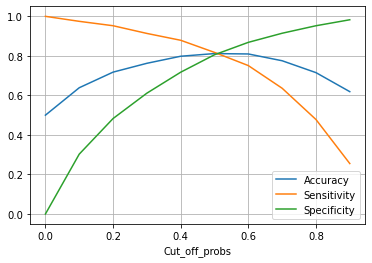

In [2091]:
# Plotting the accuracy, sensitivity and specificity for various cut off probabilities.
evaluation.plot.line(x='Cut_off_probs', y=['Accuracy','Sensitivity','Specificity'],grid=True)
plt.show()

### Evaluating the above model on the test set

In [2092]:
X_test_sm_pca_lr = sm.add_constant(X_test_pca_lr[col])

# Getting the predicted values on the test set
y_test_predicted_prob = res_pca.predict(X_test_sm_pca_lr)

# Converting the predicted values into a series
y_test_predicted_prob = y_test_predicted_prob.values.reshape(-1)

test_predictions = pd.DataFrame({'Actual':y_test_pca_lr.values, 'Churn_Probability':y_test_predicted_prob})


# Storing the predicted values as 'Churn_Probability'
test_predictions['Churn_Probability'] = y_test_predicted_prob


# Creating columns with predictions for different probability cutoffs 
test_predictions['Predicted_Churn']= test_predictions['Churn_Probability'].map(lambda x: 1 if x > 0.5 else 0)

test_predictions.head()


,Actual,Churn_Probability,Predicted_Churn
0,0,0.015677,0
1,0,0.138346,0
2,0,0.370937,0
3,0,0.831961,1
4,0,0.131447,0


In [2093]:
#Checking the overall accuracy on the test set 
metrics.accuracy_score(test_predictions['Actual'], test_predictions['Predicted_Churn'])

0.7972447505832685

In [2094]:
#Creating the Confusion Matrix for the predictions on the test set
confusion2 = metrics.confusion_matrix(test_predictions['Actual'], test_predictions['Predicted_Churn'] )

TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

# Checking the sensitivity of our logistic regression model on the test set
print('Sensitivity of the logistic regression model on the train set is:',TP / float(TP+FN))

# Checking the specificity of our logistic regression model on the test set
print('Specificity of the logistic regression model on the train set is:',TN / float(TN+FP))


Sensitivity of the logistic regression model on the train set is: 0.8060109289617486
Specificity of the logistic regression model on the train set is: 0.7964687386624743


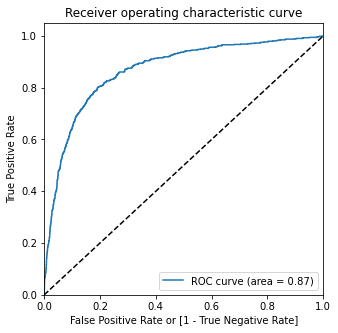

In [2095]:
# Plotting the ROC curve on the train set
fpr, tpr, thresholds = metrics.roc_curve( predictions['Actual'], predictions['Churn_Probability'], drop_intermediate = False )
draw_roc(test_predictions['Actual'], test_predictions['Churn_Probability'])

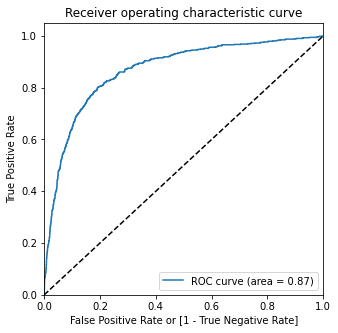

In [2096]:
# Plotting the ROC curve on the test set
fpr, tpr, thresholds = metrics.roc_curve( test_predictions['Actual'], test_predictions['Churn_Probability'], drop_intermediate = False )
draw_roc(test_predictions['Actual'], test_predictions['Churn_Probability'])

## Comparison of Logistic Regression models with and without PCA: 

***Logistic Regression Model without PCA:*** 
- 1) The sensitivity and accuracy with 14 explainable features was about 77%.
- 2) The roc-auc score was found to be around 85% on both the train and test sets. 

***Logistic Regression Model with PCA:***
- 1) The sensitivity and accuracy with 40 PCA components improved to around 80%.
- 2) The roc-auc score also increased to 87% on both the train and test sets

# XGBoost Classification

In [2097]:
# Creating a train dataframe with the predictor features
X_train = df_trainb.drop(['Churn'], axis=1)

In [2098]:
# Creating the train dataframe with the target/dependent variables
y_train = df_trainb['Churn']

In [2099]:
# Importing xgboost
import xgboost as xgb

In [2100]:
# Fitting the xgboost classifier on the train set 
xgbclf = xgb.XGBClassifier()
xgbclf.fit(X_train,y_train)

[14:56:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [2101]:
# Making predictions on the train set 
y_train_pred=xgbclf.predict(X_train)

In [2103]:
# Evaluating the model on train and test set
X_test = df_test.drop('Churn',axis=1)
y_test = df_test['Churn']
y_train_pred = xgbclf.predict(X_train)
y_test_pred = xgbclf.predict(X_test)
evaluate_model(xgbclf,X_train,X_test)

The accuracy of the model on the train set is:0.9968377397615344
The accuracy of the model on the test set is:0.9246750361070992
The sensitivity of the model on the train set is:0.9997926386728875
The specificity of the model on the train set is:0.9938828408501814
The sensitivity of the model on the test set is:0.6844262295081968
The specificity of the model on the test set is:0.9459426774700689


***The XGBoost Classifier with default parameters strongly overfits the data. The model has a high sensitvity of 99.9% on the train set whereas it has a low sensitivity of 68% on the test set.*** 

In [795]:
params = {'learning_rate':[0.1,0.2,0.3,0.4,0.5],
         'max_depth':[3,4,6,5],
         'min_child_weight':[1,2,3],
         'n_estimators':[100,150,200]}

grid_search = GridSearchCV(estimator = xgbclf, param_grid=params, cv=4, verbose=1, n_jobs=-1, scoring='roc_auc')

grid_search.fit(X_train,y_train)

Fitting 4 folds for each of 180 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed: 16.9min
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed: 41.7min
[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed: 68.5min finished


[19:32:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


GridSearchCV(cv=4,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0, gpu_id=-1,
                                     importance_type='gain',
                                     interaction_constraints='',
                                     learning_rate=0.300000012,
                                     max_delta_step=0, max_depth=6,
                                     min_child_weight=1, missing=nan,
                                     monotone_constraints='()',
                                     n_estimators=100, n_jobs=8,
                                     num_parallel_tree=1, random_state=0,
                                     reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, subsample=1,
                                     tree_method='exact', validate_parameters=1,
         

In [1881]:
# Creating a dataframe having the results of the grid search
grid_search_results=pd.DataFrame(grid_search.cv_results_)
grid_search_results.head()
# Checking the hyperparameters of the best estimator
grid_search.best_estimator_



RandomForestClassifier(max_depth=12, min_samples_leaf=200, n_estimators=200,
                       oob_score=True, random_state=100)

In [2104]:
xgbclf2 = xgb.XGBClassifier(learning_rate=0.3,n_estimators=200,min_child_weight=1,max_depth=6)

In [2105]:
xgbclf2.fit(X_train,y_train)

[14:58:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.3, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=200, n_jobs=8, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [2106]:
y_train_pred=xgbclf2.predict(X_train)

In [2107]:
# Evaluating the model on train and test set
X_test = df_test.drop('Churn',axis=1)
y_test = df_test['Churn']
y_train_pred = xgbclf2.predict(X_train)
y_test_pred = xgbclf2.predict(X_test)
evaluate_model(xgbclf2,X_train,X_test)

The accuracy of the model on the train set is:0.9999481596682219
The accuracy of the model on the test set is:0.9288967892456393
The sensitivity of the model on the train set is:1.0
The specificity of the model on the train set is:0.9998963193364437
The sensitivity of the model on the test set is:0.657103825136612
The specificity of the model on the test set is:0.9529568267021405


***Even after hyper-parameter tuning the XGBoost model severly overfits the training data.***

# Recommendations based on the Models:

- ***1) A majority of the high value customers that tend to churn, have a high usage of roaming services. These customers had a consistently high usage of roaming services indicating that these customers were frequent travellers. Providing such customers who were likely churners and had a high usage of roaming facilities with offers that would aid in keeping their roaming expenses under check would be beneicial in retaining high value customers.*** 

- ***2) The distribution of churning customers in terms of usage of services(minutes of usage of voice calls and mobile internet usage) is evidently different from that of non-churning customers. One such predictor that was derived from the data was an important classifier of churn in the logistic regression model. Therefore, to identify if a high value customer is likely to churn, one can look at the usage behaviour of the customer. A significant decline in the usage from the monthly average of previous few months can be a strong indicator of churn.***

- ***3) During the good phase, there was also an almost equal distribution of Churning customers and non-Churning customers who were utilizing serivices of Facebook and other similar social networking websites. There is a clear decline in the percentage of churners utilizing Facebook services from 43% in the month of June to only 14% of churners utilizing Facebook services in the month of August. This could perhaps indicate that other competitors in the market were providing similar services at discounted prices. Recognizing the usage pattern of customers and offering them timely discounts for such similar services could also help in retaining valuable customers.*** 

